<a href="https://colab.research.google.com/github/Gregory-lab-eng/python_Vistula/blob/main/Strakhov_75209_Uklady_LTI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1



=== IDENTITY ===


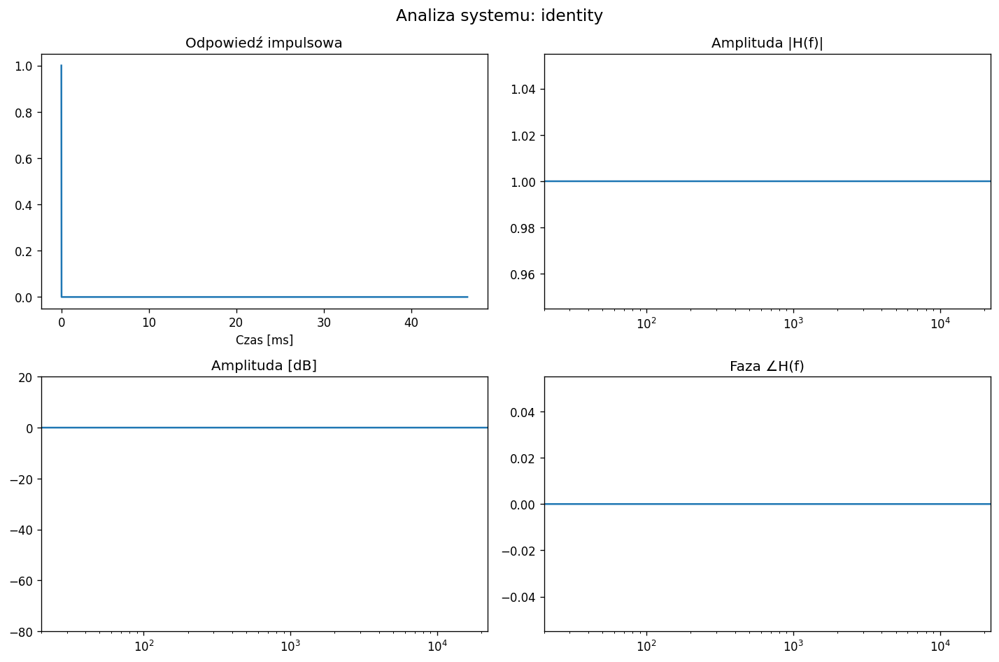

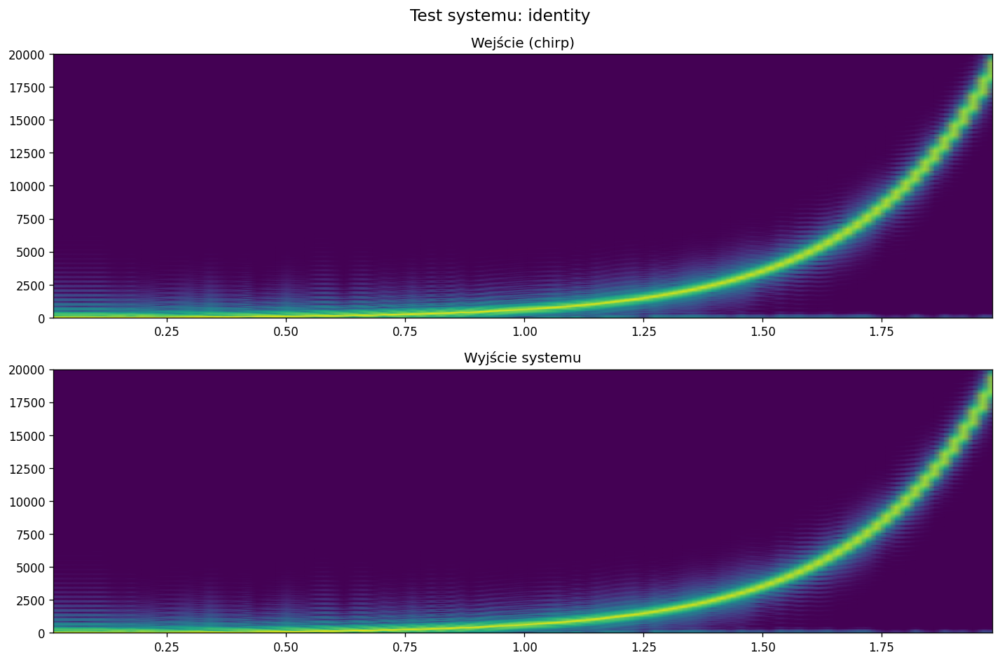


=== DELAY ===


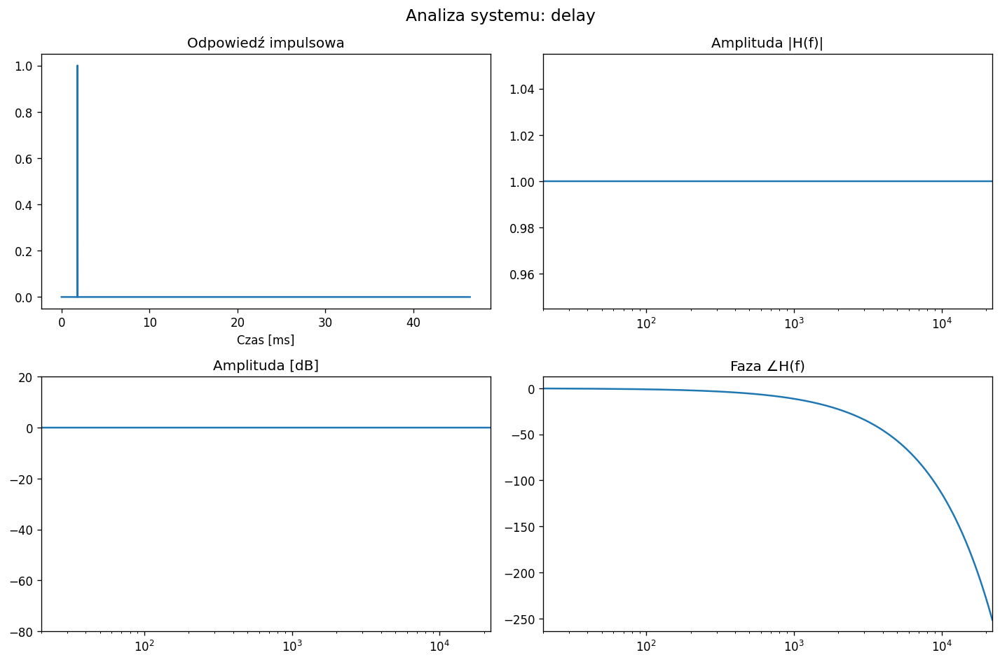

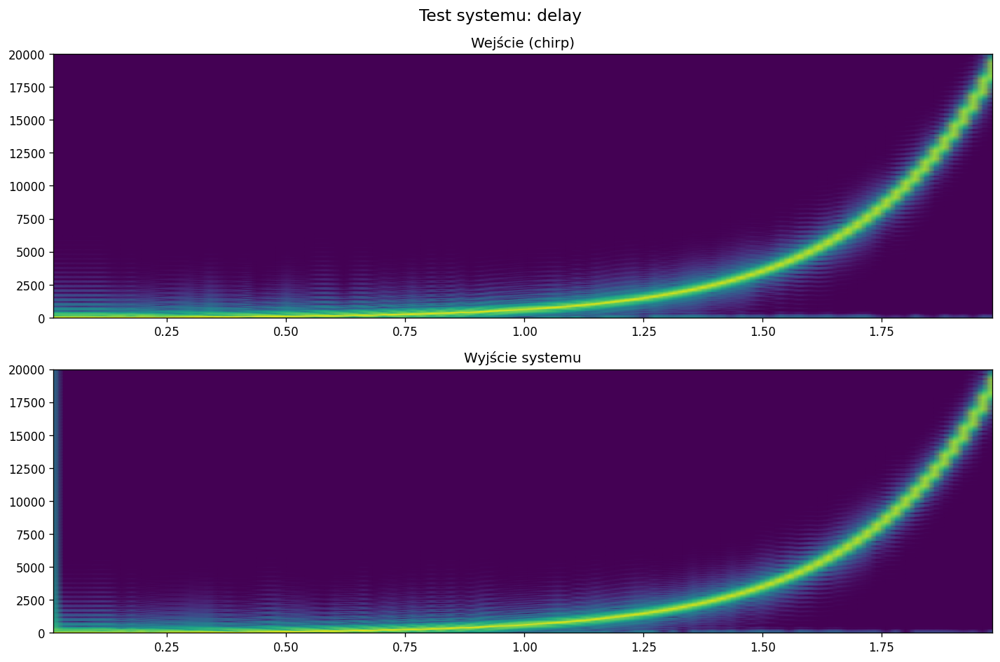


=== ECHO ===


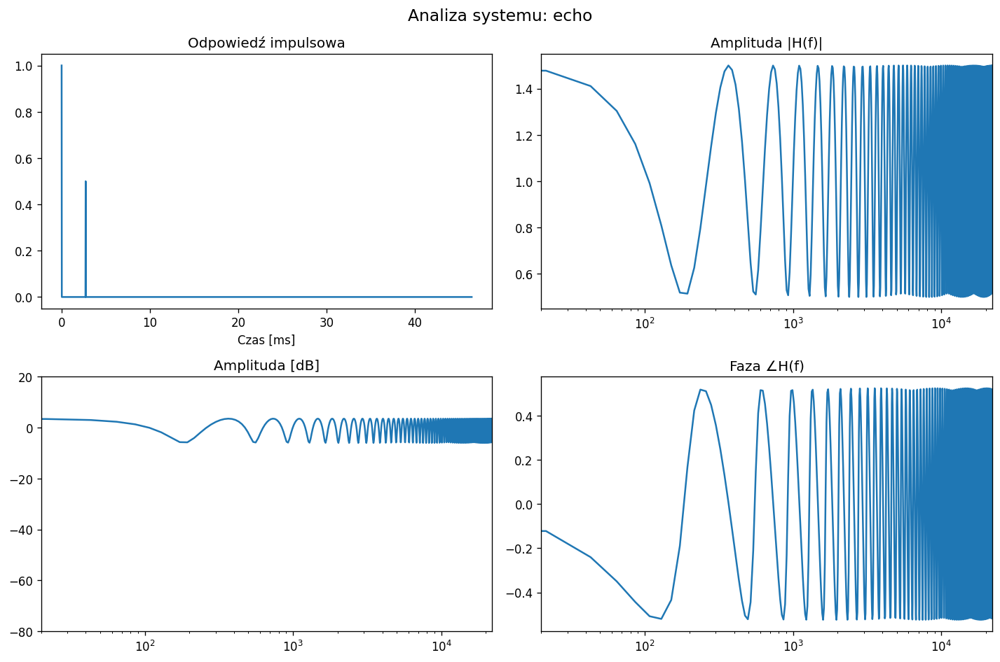

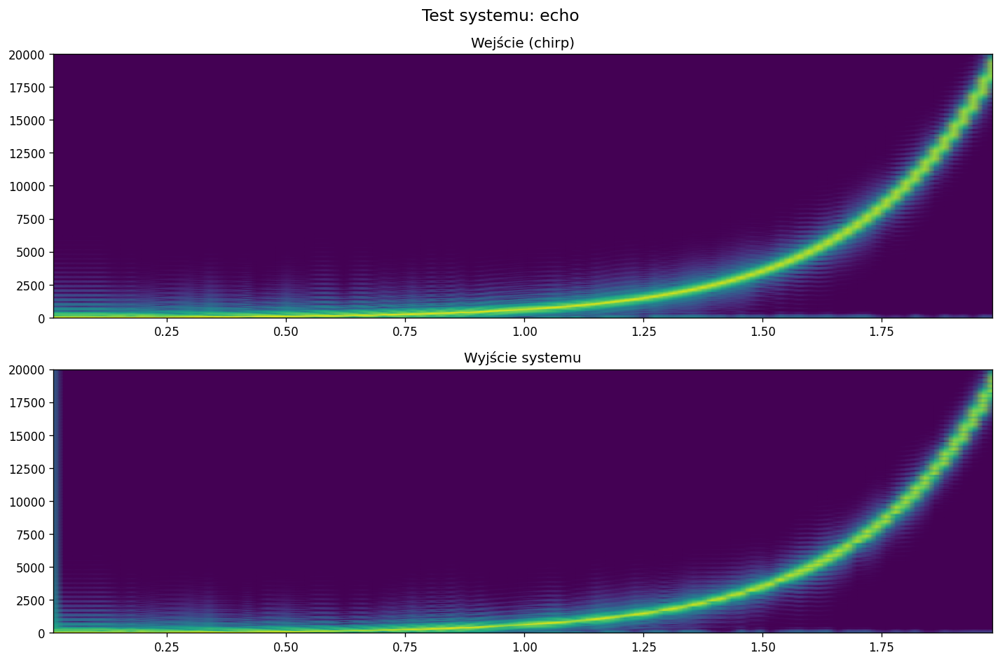


=== MULTI_ECHO ===


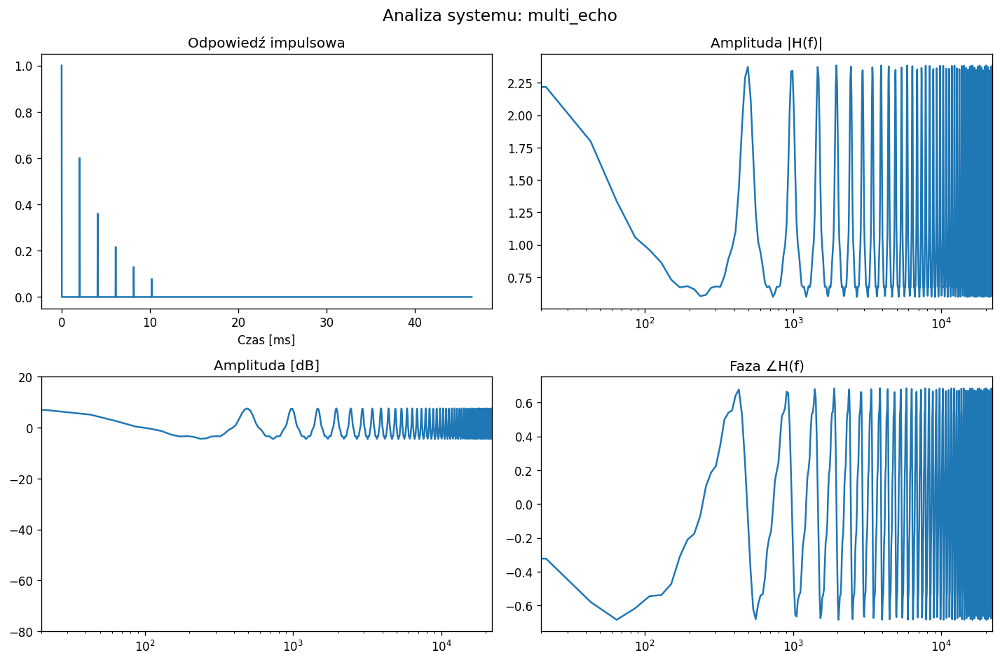

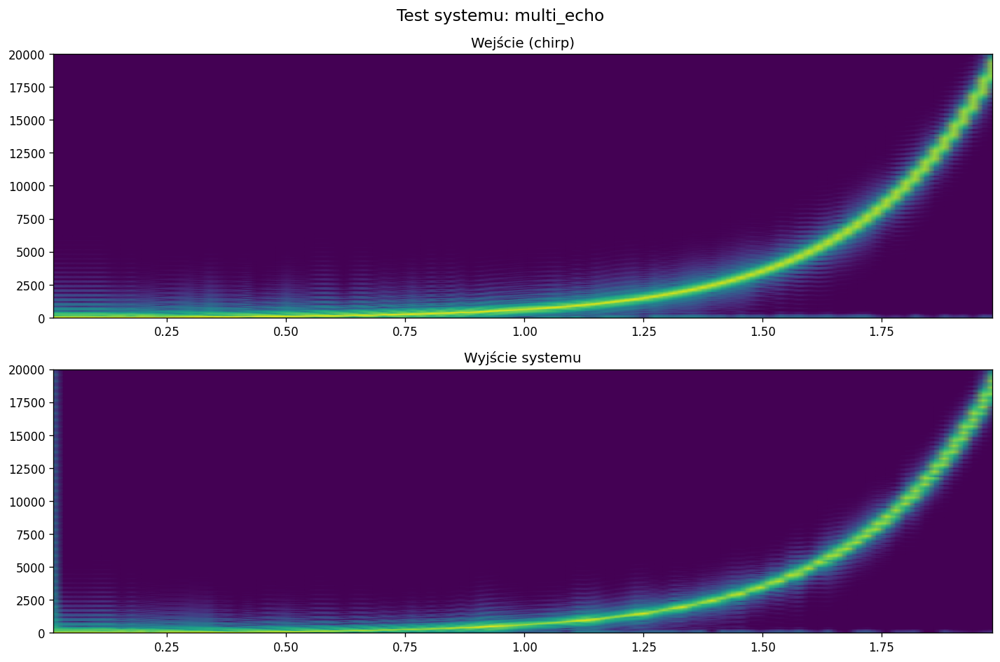


=== REVERB ===


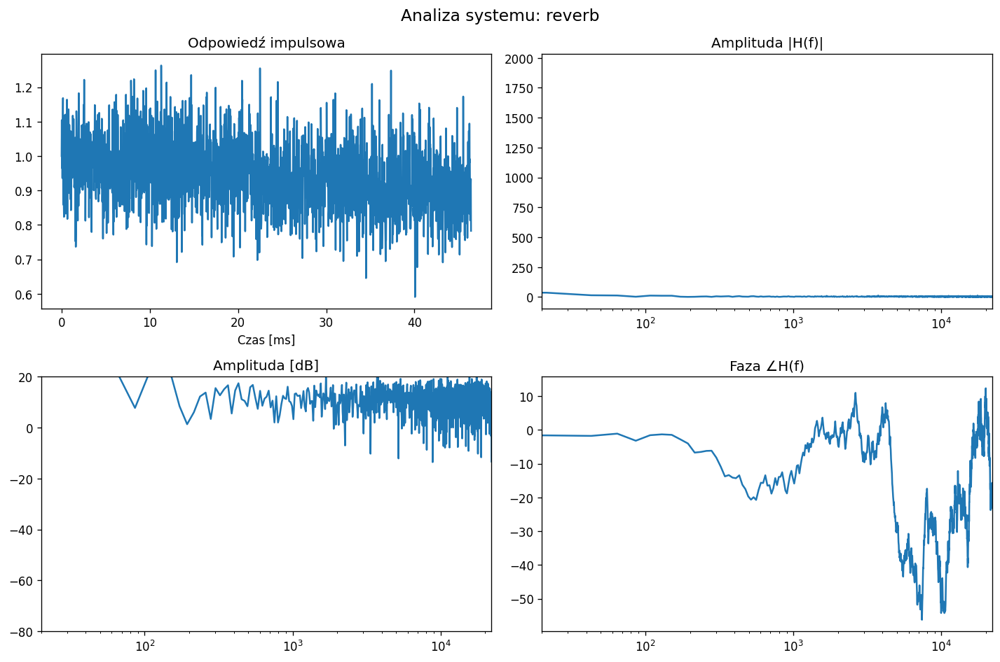

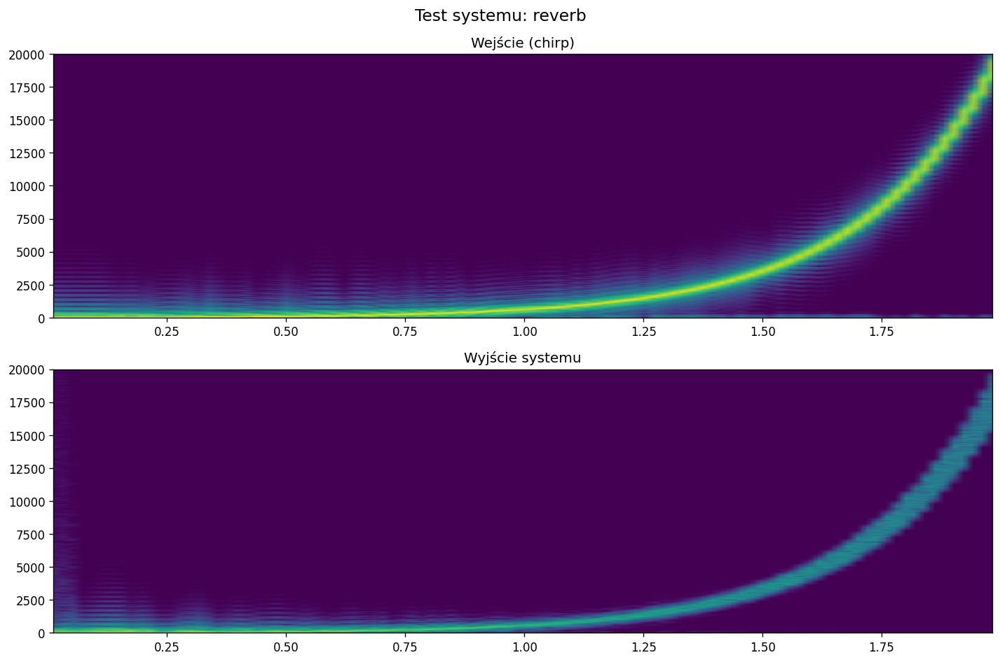

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams['figure.dpi'] = 120
plt.rcParams['figure.figsize'] = (10, 6)

def create_impulse_responses(N=2048, fs=44100):
    r = {}

    h = np.zeros(N)
    h[0] = 1
    r["identity"] = h

    delay = 80
    h = np.zeros(N)
    h[delay] = 1
    r["delay"] = h

    echo_delay = 120
    echo_gain = 0.5
    h = np.zeros(N)
    h[0] = 1
    h[echo_delay] = echo_gain
    r["echo"] = h

    num = 6
    spacing = 90
    decay = 0.6
    h = np.zeros(N)
    for i in range(num):
        idx = i * spacing
        if idx < N:
            h[idx] = decay**i
    r["multi_echo"] = h

    t = np.arange(N) / fs
    decay_time = 0.4
    h = np.exp(-t / decay_time)
    h *= (1 + 0.1 * np.random.randn(N))
    h[0] = 1
    r["reverb"] = h

    return r

def analyze_impulse_response(h, fs=44100, name="System"):
    N = len(h)
    H = np.fft.rfft(h)
    freqs = np.fft.rfftfreq(N, 1/fs)

    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f"Analiza systemu: {name}", fontsize=14)

    ax[0,0].plot(np.arange(N)/fs*1000, h)
    ax[0,0].set_title("Odpowiedź impulsowa")
    ax[0,0].set_xlabel("Czas [ms]")

    ax[0,1].semilogx(freqs, np.abs(H))
    ax[0,1].set_title("Amplituda |H(f)|")
    ax[0,1].set_xlim([20, fs/2])

    ax[1,0].semilogx(freqs, 20*np.log10(np.abs(H)+1e-12))
    ax[1,0].set_title("Amplituda [dB]")
    ax[1,0].set_xlim([20, fs/2])
    ax[1,0].set_ylim([-80, 20])

    ax[1,1].semilogx(freqs, np.unwrap(np.angle(H)))
    ax[1,1].set_title("Faza ∠H(f)")
    ax[1,1].set_xlim([20, fs/2])

    plt.tight_layout()
    plt.show()

def test_system_with_chirp(h, fs=44100, name="System"):
    duration = 2.0
    t = np.linspace(0, duration, int(fs*duration))
    chirp = signal.chirp(t, 20, duration, 20000, method="logarithmic")

    N = len(chirp) + len(h) - 1
    Y = np.fft.ifft(np.fft.fft(chirp, N) * np.fft.fft(h, N)).real
    Y = Y[:len(chirp)]

    chirp /= np.max(np.abs(chirp))
    Y /= np.max(np.abs(Y))

    fig, ax = plt.subplots(2, 1, figsize=(12, 8))
    fig.suptitle(f"Test systemu: {name}", fontsize=14)

    f, tt, S = signal.spectrogram(chirp, fs, nperseg=1024)
    ax[0].pcolormesh(tt, f, 10*np.log10(S+1e-12), shading="gouraud")
    ax[0].set_title("Wejście (chirp)")
    ax[0].set_ylim([0, 20000])

    f, tt, S = signal.spectrogram(Y, fs, nperseg=1024)
    ax[1].pcolormesh(tt, f, 10*np.log10(S+1e-12), shading="gouraud")
    ax[1].set_title("Wyjście systemu")
    ax[1].set_ylim([0, 20000])

    plt.tight_layout()
    plt.show()

fs = 44100
N = 2048

responses = create_impulse_responses(N, fs)

for name, h in responses.items():
    print(f"\n=== {name.upper()} ===")
    analyze_impulse_response(h, fs, name)
    test_system_with_chirp(h, fs, name)


2

Projektowanie filtru korekcyjnego...
Aplikowanie korekcji...

Analiza wyników...


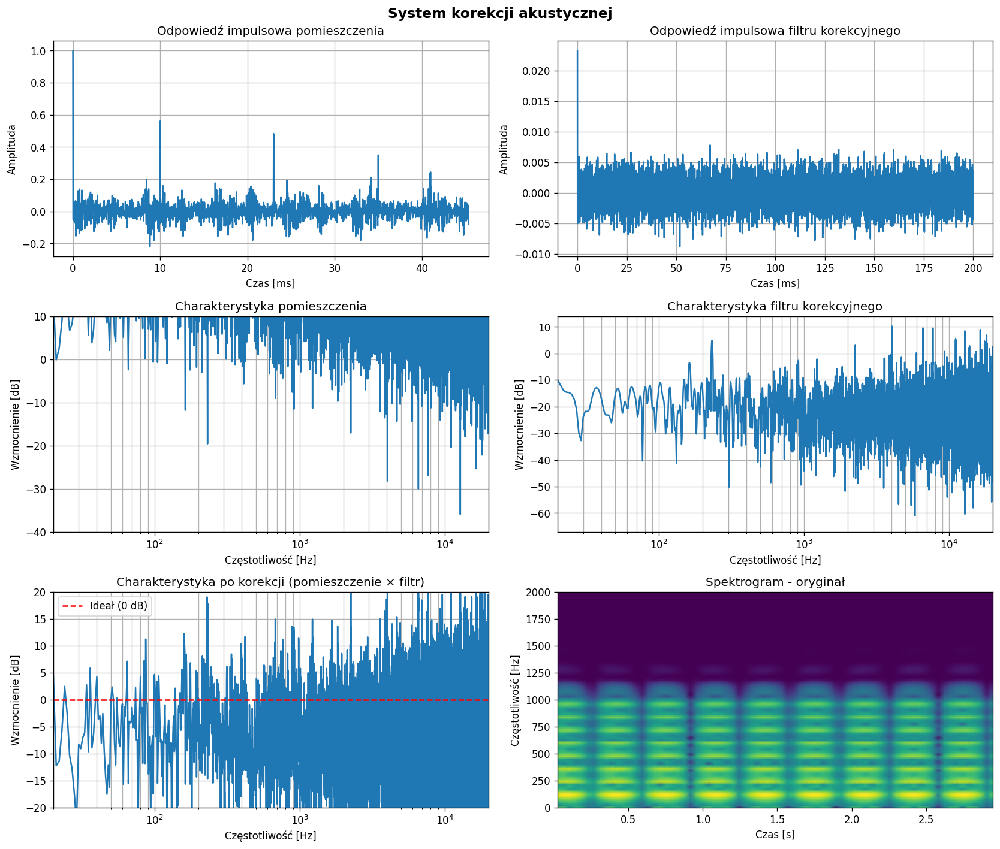

/tmp/ipython-input-2084634598.py:247: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


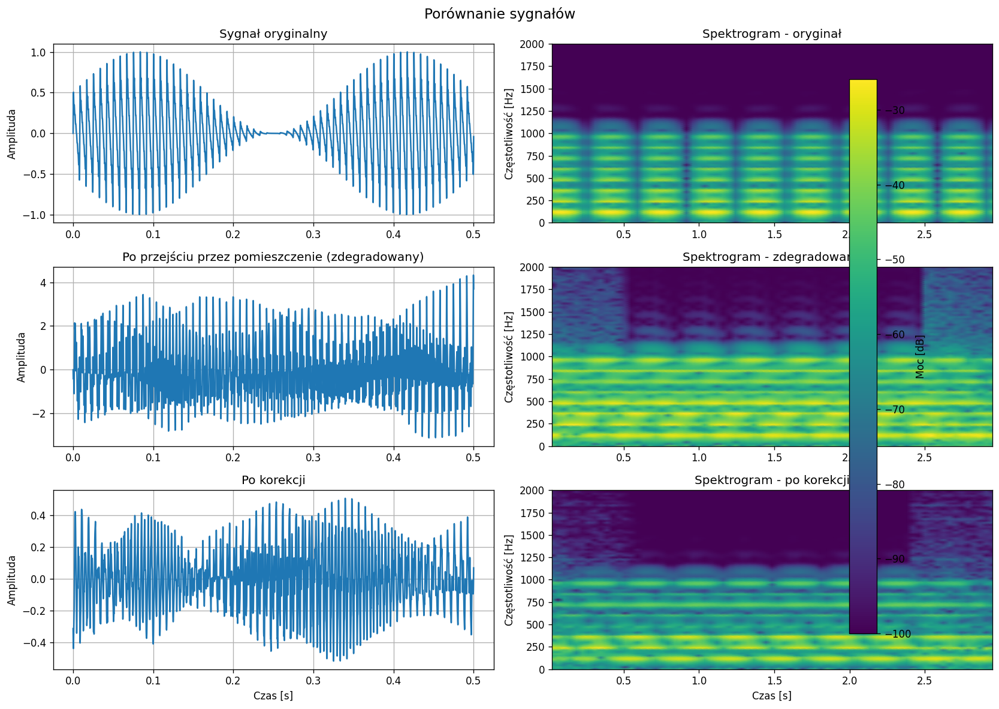


METRYKI JAKOŚCI KOREKCJI
SNR (zdegradowany vs. oryginał): -2.43 dB
SNR (po korekcji vs. oryginał): -2.76 dB
Poprawa SNR: -0.33 dB

Korelacja z oryginałem:
  Zdegradowany: -0.0978
  Po korekcji: 0.1776
  Poprawa: 0.2753


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, ifft

def create_bad_room_response(duration=1.0, fs=44100):
    """
    Tworzy odpowiedź impulsową pomieszczenia z problemami akustycznymi
    - Nadmierny pogłos
    - Rezonanse (stojące fale)
    """
    N = int(duration * fs)
    t = np.arange(N) / fs

    h = np.zeros(N)

    # Główny impuls
    h[0] = 1.0

    # Wczesne odbicia (z powierzchni ścian)
    early_reflections = [
        (0.010, 0.7),   # 10 ms, 70% amplitudy
        (0.023, 0.5),   # 23 ms, 50%
        (0.035, 0.4),   # 35 ms, 40%
        (0.048, 0.3),   # 48 ms, 30%
    ]

    for delay, gain in early_reflections:
        idx = int(delay * fs)
        if idx < N:
            h[idx] += gain

    # Późny pogłos (exponential decay z modulacją)
    decay_time = 0.8  # seconds (zbyt długi!)
    reverb_tail = np.exp(-t / decay_time)

    # Dodaj modulację (rezonanse pomieszczenia)
    resonances = [125, 250, 500]  # Hz - problematyczne częstotliwości
    for freq in resonances:
        reverb_tail *= (1 + 0.3 * np.sin(2 * np.pi * freq * t))

    # Pogłos jako losowy szum z zanikającą obwiednią
    reverb_noise = np.random.randn(N) * 0.05
    h += reverb_noise * reverb_tail

    # Normalizacja
    h /= np.max(np.abs(h))

    return h

def design_inverse_filter(h, fs=44100, regularization=0.01):
    """
    Projektuje filtr odwrotny do danej odpowiedzi impulsowej
    Używa regularyzacji Tikhonova aby uniknąć wzmocnienia szumu

    H_inv(f) ≈ H*(f) / (|H(f)|² + λ)

    gdzie:
    - H*(f) to sprzężenie zespolone H(f)
    - λ to parametr regularyzacji
    """
    N = len(h)

    # DFT odpowiedzi impulsowej
    H = fft(h)

    # Regularyzowany filtr odwrotny
    # Zapobiega dzieleniu przez zero i wzmacnianiu szumu
    H_inv = np.conj(H) / (np.abs(H)**2 + regularization)

    # Powrót do dziedziny czasu
    h_inv = ifft(H_inv).real

    # Przycinamy do rozsądnej długości (np. 20% oryginału)
    cutoff = N // 5
    h_inv = h_inv[:cutoff]

    return h_inv

def apply_equalization(signal_in, h_room, h_inv):
    """
    Aplikuje korekcję akustyczną

    1. Sygnał przechodzi przez pomieszczenie: y = x * h_room
    2. Korekcja: z = y * h_inv ≈ x
    """
    # Sygnał w pomieszczeniu (przed korekcją)
    degraded = np.convolve(signal_in, h_room, mode='same')

    # Zastosuj filtr korekcyjny
    corrected = np.convolve(degraded, h_inv, mode='same')

    return degraded, corrected

def test_equalization_system():
    """
    Kompleksowy test systemu korekcji akustycznej
    """
    fs = 44100

    # 1. Stwórz "złą" odpowiedź impulsową
    h_room = create_bad_room_response(duration=1.0, fs=fs)

    # 2. Zaprojektuj filtr korekcyjny
    print("Projektowanie filtru korekcyjnego...")
    h_inv = design_inverse_filter(h_room, fs, regularization=0.001)

    # 3. Utwórz sygnał testowy (muzyka/mowa)
    duration = 3.0
    t = np.arange(int(duration * fs)) / fs

    # Symulacja mowy: suma tonów o różnych częstotliwościach
    fundamental = 120  # Hz (częstotliwość podstawowa głosu)
    harmonics = [1, 2, 3, 4, 5, 6, 7, 8]
    speech_signal = np.zeros_like(t)

    for n in harmonics:
        amplitude = 1.0 / n  # spadek amplitudy dla wyższych harmonicznych
        speech_signal += amplitude * np.sin(2 * np.pi * fundamental * n * t)

    # Modulacja amplitudy (symulacja mowy)
    modulation = 0.5 + 0.5 * np.sin(2 * np.pi * 3 * t)  # 3 Hz modulacja
    speech_signal *= modulation

    # Normalizacja
    speech_signal /= np.max(np.abs(speech_signal))

    # 4. Zastosuj korekcję
    print("Aplikowanie korekcji...")
    degraded, corrected = apply_equalization(speech_signal, h_room, h_inv)

    # 5. Analiza wyników
    print("\nAnaliza wyników...")

    # Charakterystyki częstotliwościowe
    fig, axes = plt.subplots(3, 2, figsize=(14, 12))
    fig.suptitle('System korekcji akustycznej', fontsize=14, fontweight='bold')

    # Odpowiedzi impulsowe
    t_imp = np.arange(len(h_room)) / fs * 1000
    axes[0, 0].plot(t_imp[:2000], h_room[:2000])
    axes[0, 0].set_title('Odpowiedź impulsowa pomieszczenia')
    axes[0, 0].set_xlabel('Czas [ms]')
    axes[0, 0].set_ylabel('Amplituda')
    axes[0, 0].grid(True)

    t_inv = np.arange(len(h_inv)) / fs * 1000
    axes[0, 1].plot(t_inv, h_inv)
    axes[0, 1].set_title('Odpowiedź impulsowa filtru korekcyjnego')
    axes[0, 1].set_xlabel('Czas [ms]')
    axes[0, 1].set_ylabel('Amplituda')
    axes[0, 1].grid(True)

    # Charakterystyki częstotliwościowe
    H_room = fft(h_room)
    H_inv = fft(h_inv, n=len(h_room))
    H_combined = H_room * H_inv
    freqs = np.fft.fftfreq(len(h_room), 1/fs)
    pos_idx = freqs >= 0

    axes[1, 0].semilogx(freqs[pos_idx], 20*np.log10(np.abs(H_room[pos_idx]) + 1e-10))
    axes[1, 0].set_title('Charakterystyka pomieszczenia')
    axes[1, 0].set_xlabel('Częstotliwość [Hz]')
    axes[1, 0].set_ylabel('Wzmocnienie [dB]')
    axes[1, 0].grid(True, which='both')
    axes[1, 0].set_xlim([20, 20000])
    axes[1, 0].set_ylim([-40, 10])

    axes[1, 1].semilogx(freqs[pos_idx], 20*np.log10(np.abs(H_inv[pos_idx]) + 1e-10))
    axes[1, 1].set_title('Charakterystyka filtru korekcyjnego')
    axes[1, 1].set_xlabel('Częstotliwość [Hz]')
    axes[1, 1].set_ylabel('Wzmocnienie [dB]')
    axes[1, 1].grid(True, which='both')
    axes[1, 1].set_xlim([20, 20000])

    # Charakterystyka łączna
    axes[2, 0].semilogx(freqs[pos_idx], 20*np.log10(np.abs(H_combined[pos_idx]) + 1e-10))
    axes[2, 0].axhline(y=0, color='r', linestyle='--', label='Ideał (0 dB)')
    axes[2, 0].set_title('Charakterystyka po korekcji (pomieszczenie × filtr)')
    axes[2, 0].set_xlabel('Częstotliwość [Hz]')
    axes[2, 0].set_ylabel('Wzmocnienie [dB]')
    axes[2, 0].grid(True, which='both')
    axes[2, 0].set_xlim([20, 20000])
    axes[2, 0].set_ylim([-20, 20])
    axes[2, 0].legend()

    # Spektrogramy
    nperseg = 2048

    # Oryginał
    f, t_spec, Sxx = signal.spectrogram(speech_signal[:len(degraded)], fs, nperseg=nperseg)
    axes[2, 1].pcolormesh(t_spec, f, 10*np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
    axes[2, 1].set_title('Spektrogram - oryginał')
    axes[2, 1].set_ylabel('Częstotliwość [Hz]')
    axes[2, 1].set_xlabel('Czas [s]')
    axes[2, 1].set_ylim([0, 2000])

    plt.tight_layout()
    plt.show()

    # Porównanie sygnałów czasowych i spektrogramów
    fig, axes = plt.subplots(3, 2, figsize=(14, 10))
    fig.suptitle('Porównanie sygnałów', fontsize=14)

    # Przebiegi czasowe
    plot_duration = 0.5  # sekundy
    plot_samples = int(plot_duration * fs)
    t_plot = t[:plot_samples]

    axes[0, 0].plot(t_plot, speech_signal[:plot_samples])
    axes[0, 0].set_title('Sygnał oryginalny')
    axes[0, 0].set_ylabel('Amplituda')
    axes[0, 0].grid(True)

    axes[1, 0].plot(t_plot, degraded[:plot_samples])
    axes[1, 0].set_title('Po przejściu przez pomieszczenie (zdegradowany)')
    axes[1, 0].set_ylabel('Amplituda')
    axes[1, 0].grid(True)

    axes[2, 0].plot(t_plot, corrected[:plot_samples])
    axes[2, 0].set_title('Po korekcji')
    axes[2, 0].set_xlabel('Czas [s]')
    axes[2, 0].set_ylabel('Amplituda')
    axes[2, 0].grid(True)

    # Spektrogramy
    f, t_spec, Sxx = signal.spectrogram(speech_signal, fs, nperseg=nperseg)
    axes[0, 1].pcolormesh(t_spec, f, 10*np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
    axes[0, 1].set_title('Spektrogram - oryginał')
    axes[0, 1].set_ylabel('Częstotliwość [Hz]')
    axes[0, 1].set_ylim([0, 2000])

    f, t_spec, Sxx = signal.spectrogram(degraded, fs, nperseg=nperseg)
    axes[1, 1].pcolormesh(t_spec, f, 10*np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
    axes[1, 1].set_title('Spektrogram - zdegradowany')
    axes[1, 1].set_ylabel('Częstotliwość [Hz]')
    axes[1, 1].set_ylim([0, 2000])

    f, t_spec, Sxx = signal.spectrogram(corrected, fs, nperseg=nperseg)
    im = axes[2, 1].pcolormesh(t_spec, f, 10*np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
    axes[2, 1].set_title('Spektrogram - po korekcji')
    axes[2, 1].set_xlabel('Czas [s]')
    axes[2, 1].set_ylabel('Częstotliwość [Hz]')
    axes[2, 1].set_ylim([0, 2000])

    plt.colorbar(im, ax=axes[:, 1], label='Moc [dB]')
    plt.tight_layout()
    plt.show()

    # Metryki jakości
    print("\n" + "="*60)
    print("METRYKI JAKOŚCI KOREKCJI")
    print("="*60)

    # SNR (Signal-to-Noise Ratio) - porównanie z oryginałem
    def calculate_snr(reference, signal):
        noise = reference - signal
        signal_power = np.mean(reference**2)
        noise_power = np.mean(noise**2)
        if noise_power == 0:
            return float('inf')
        return 10 * np.log10(signal_power / noise_power)

    # Przygotuj sygnały do porównania (ta sama długość)
    min_len = min(len(speech_signal), len(degraded), len(corrected))
    orig = speech_signal[:min_len]
    degr = degraded[:min_len]
    corr = corrected[:min_len]

    # Normalizacja amplitud dla uczciwego porównania
    orig = orig / np.max(np.abs(orig))
    degr = degr / np.max(np.abs(degr))
    corr = corr / np.max(np.abs(corr))

    snr_degraded = calculate_snr(orig, degr)
    snr_corrected = calculate_snr(orig, corr)

    print(f"SNR (zdegradowany vs. oryginał): {snr_degraded:.2f} dB")
    print(f"SNR (po korekcji vs. oryginał): {snr_corrected:.2f} dB")
    print(f"Poprawa SNR: {snr_corrected - snr_degraded:.2f} dB")

    # Korelacja z oryginałem
    corr_degraded = np.corrcoef(orig, degr)[0, 1]
    corr_corrected = np.corrcoef(orig, corr)[0, 1]

    print(f"\nKorelacja z oryginałem:")
    print(f"  Zdegradowany: {corr_degraded:.4f}")
    print(f"  Po korekcji: {corr_corrected:.4f}")
    print(f"  Poprawa: {(corr_corrected - corr_degraded):.4f}")

# Uruchom test
test_equalization_system()

3


TEST 1: SINUSOIDY

Test: Sinusoidy
Długość x: 1000, Długość h: 100

Czas wykonania:
  Dziedzina czasu: 0.0818 ms
  Dziedzina częstotliwości: 0.7057 ms
  Przyspieszenie: 0.12x

Błędy:
  Maksymalny błąd bezwzględny: 4.26e-14
  Średni błąd bezwzględny: 1.07e-14
  Maksymalny błąd względny: 2.66e-04
  Średni błąd względny: 4.76e-07


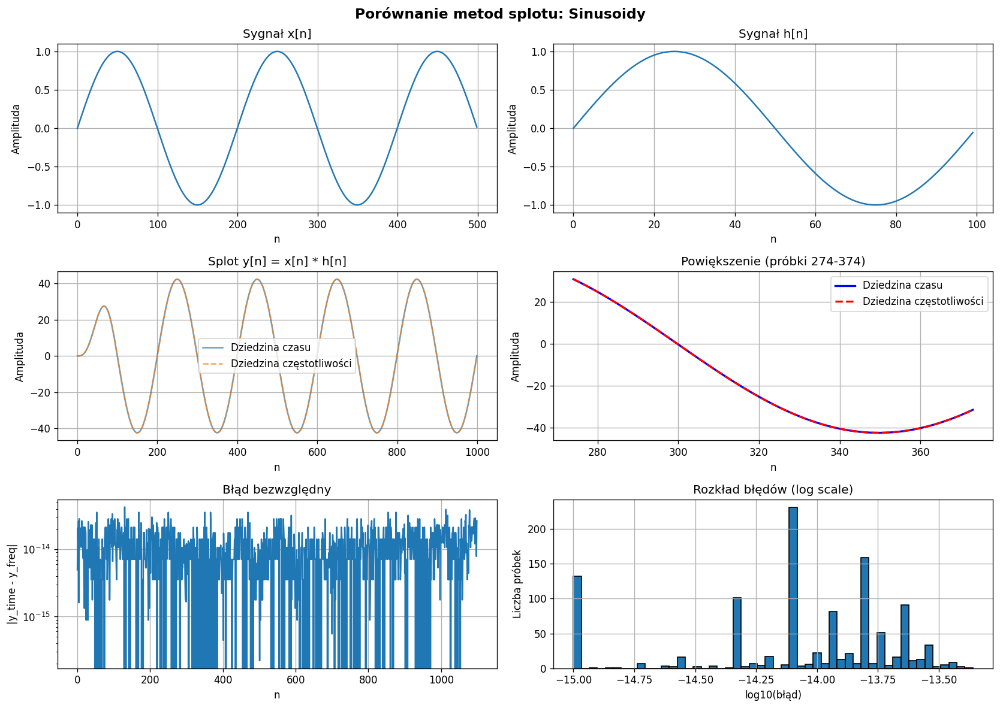


TEST 2: SZUM BIAŁY

Test: Szum biały
Długość x: 1000, Długość h: 100

Czas wykonania:
  Dziedzina czasu: 0.0951 ms
  Dziedzina częstotliwości: 0.8032 ms
  Przyspieszenie: 0.12x

Błędy:
  Maksymalny błąd bezwzględny: 2.04e-14
  Średni błąd bezwzględny: 4.53e-15
  Maksymalny błąd względny: 1.22e-12
  Średni błąd względny: 5.80e-15


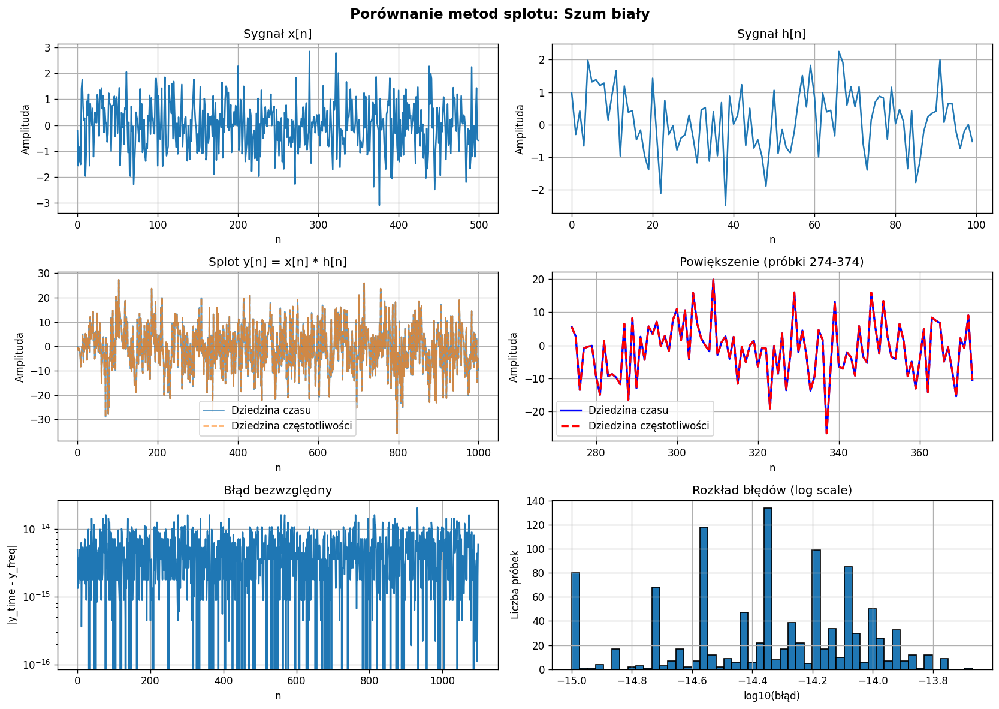


TEST 3: IMPULSY

Test: Impulsy z zanikającą odpowiedzią
Długość x: 1000, Długość h: 50

Czas wykonania:
  Dziedzina czasu: 0.1707 ms
  Dziedzina częstotliwości: 1.0359 ms
  Przyspieszenie: 0.16x

Błędy:
  Maksymalny błąd bezwzględny: 4.44e-16
  Średni błąd bezwzględny: 5.43e-17
  Maksymalny błąd względny: 2.08e-06
  Średni błąd względny: 3.95e-07


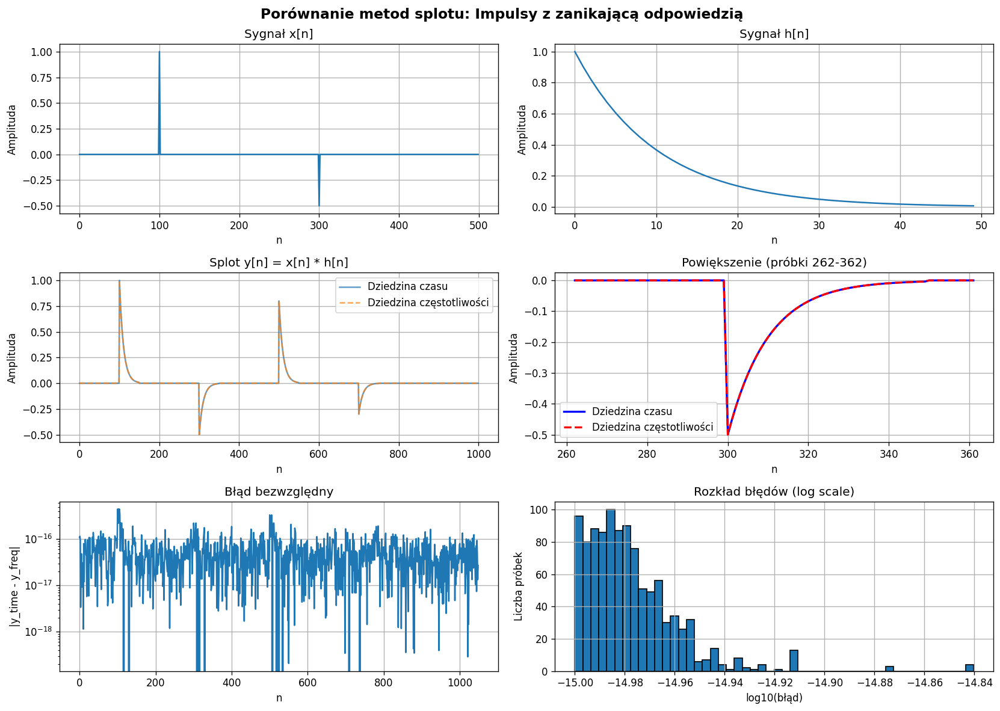


TEST 4: CHIRP

Test: Chirp z filtrem Gaussa
Długość x: 1000, Długość h: 100

Czas wykonania:
  Dziedzina czasu: 0.1228 ms
  Dziedzina częstotliwości: 1.0006 ms
  Przyspieszenie: 0.12x

Błędy:
  Maksymalny błąd bezwzględny: 1.52e-14
  Średni błąd bezwzględny: 3.12e-15
  Maksymalny błąd względny: 5.49e-10
  Średni błąd względny: 1.54e-12


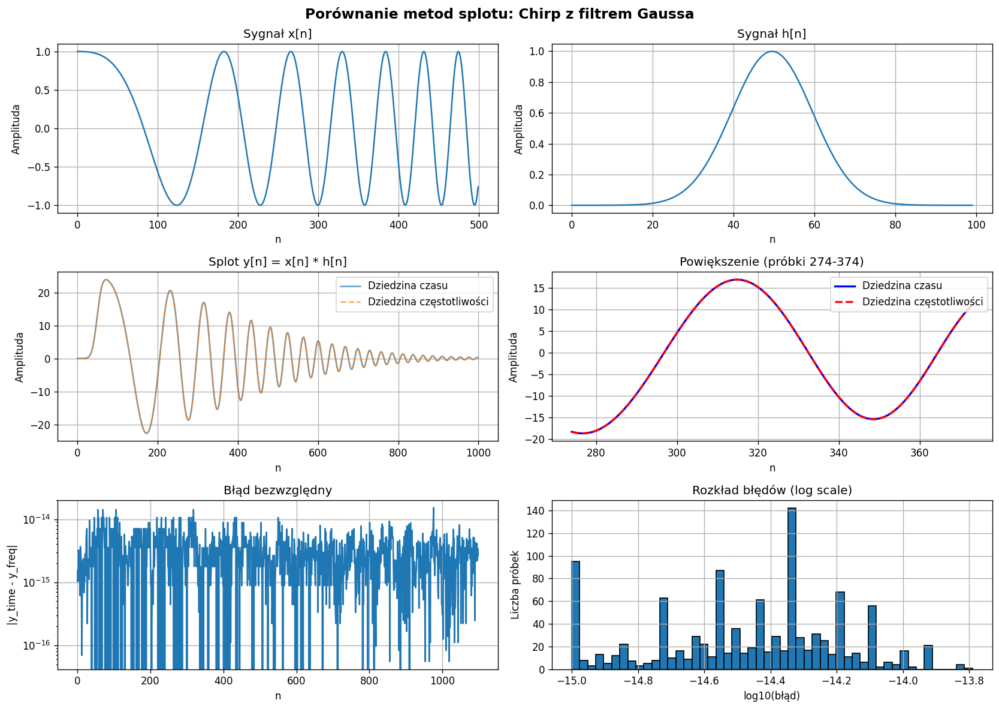


ANALIZA SKALOWANIA
N=   32: Time=  0.152ms, Freq=  0.197ms, Speedup=  0.77x, Error=2.66e-15
N=   64: Time=  0.035ms, Freq=  0.151ms, Speedup=  0.23x, Error=4.00e-15
N=  128: Time=  0.020ms, Freq=  0.164ms, Speedup=  0.12x, Error=5.33e-15
N=  256: Time=  0.032ms, Freq=  0.160ms, Speedup=  0.20x, Error=1.07e-14
N=  512: Time=  0.074ms, Freq=  0.216ms, Speedup=  0.34x, Error=1.42e-14
N= 1024: Time=  0.118ms, Freq=  0.790ms, Speedup=  0.15x, Error=5.33e-14
N= 2048: Time=  0.313ms, Freq=  1.500ms, Speedup=  0.21x, Error=6.75e-14
N= 4096: Time=  1.087ms, Freq=  3.004ms, Speedup=  0.36x, Error=7.11e-14
N= 8192: Time=  4.905ms, Freq=  6.014ms, Speedup=  0.82x, Error=1.71e-13


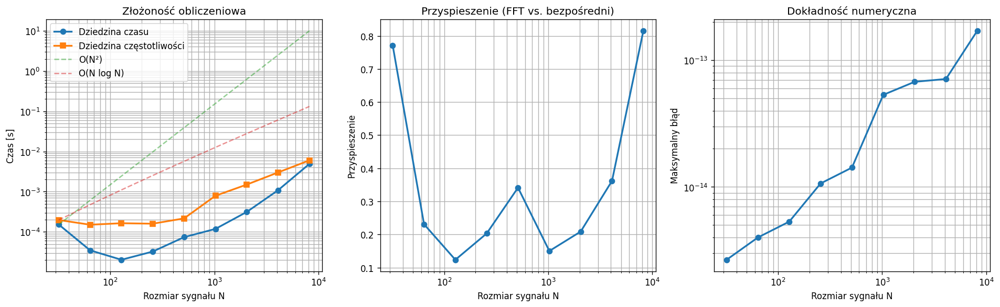

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import time
from scipy import signal
from scipy.signal.windows import gaussian

def convolution_time_domain(x, h):
    """Splot bezpośrednio w dziedzinie czasu"""
    return np.convolve(x, h, mode='full')

def convolution_frequency_domain(x, h):
    """
    Splot przez FFT w dziedzinie częstotliwości
    Zgodnie z Twierdzeniem o Splocie: x * h = IFFT(FFT(x) · FFT(h))
    """
    # Długość splotu = len(x) + len(h) - 1
    N = len(x) + len(h) - 1

    # Zero-padding do odpowiedniej długości
    X = np.fft.fft(x, N)
    H = np.fft.fft(h, N)

    # Mnożenie w dziedzinie częstotliwości
    Y = X * H

    # Powrót do dziedziny czasu
    y = np.fft.ifft(Y).real

    return y

def compare_convolution_methods(x, h, name="Test"):
    """
    Porównuje dwie metody obliczania splotu
    """
    print(f"\n{'='*70}")
    print(f"Test: {name}")
    print(f"Długość x: {len(x)}, Długość h: {len(h)}")
    print('='*70)

    # Metoda 1: dziedzina czasu
    start = time.time()
    y_time = convolution_time_domain(x, h)
    time_time = time.time() - start

    # Metoda 2: dziedzina częstotliwości
    start = time.time()
    y_freq = convolution_frequency_domain(x, h)
    time_freq = time.time() - start

    # Porównanie wyników
    error_abs = np.abs(y_time - y_freq)
    error_rel = error_abs / (np.abs(y_time) + 1e-10)

    print(f"\nCzas wykonania:")
    print(f"  Dziedzina czasu: {time_time*1000:.4f} ms")
    print(f"  Dziedzina częstotliwości: {time_freq*1000:.4f} ms")
    print(f"  Przyspieszenie: {time_time/time_freq:.2f}x")

    print(f"\nBłędy:")
    print(f"  Maksymalny błąd bezwzględny: {np.max(error_abs):.2e}")
    print(f"  Średni błąd bezwzględny: {np.mean(error_abs):.2e}")
    print(f"  Maksymalny błąd względny: {np.max(error_rel):.2e}")
    print(f"  Średni błąd względny: {np.mean(error_rel):.2e}")

    # Wizualizacja
    fig, axes = plt.subplots(3, 2, figsize=(14, 10))
    fig.suptitle(f'Porównanie metod splotu: {name}', fontsize=14, fontweight='bold')

    # Sygnały wejściowe
    axes[0, 0].plot(x[:min(500, len(x))])
    axes[0, 0].set_title('Sygnał x[n]')
    axes[0, 0].set_xlabel('n')
    axes[0, 0].set_ylabel('Amplituda')
    axes[0, 0].grid(True)

    axes[0, 1].plot(h[:min(500, len(h))])
    axes[0, 1].set_title('Sygnał h[n]')
    axes[0, 1].set_xlabel('n')
    axes[0, 1].set_ylabel('Amplituda')
    axes[0, 1].grid(True)

    # Wyniki splotu
    axes[1, 0].plot(y_time[:min(1000, len(y_time))], label='Dziedzina czasu', alpha=0.7)
    axes[1, 0].plot(y_freq[:min(1000, len(y_freq))], '--', label='Dziedzina częstotliwości', alpha=0.7)
    axes[1, 0].set_title('Splot y[n] = x[n] * h[n]')
    axes[1, 0].set_xlabel('n')
    axes[1, 0].set_ylabel('Amplituda')
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    # Powiększenie fragmentu
    zoom_start = len(y_time) // 4
    zoom_end = zoom_start + 100
    axes[1, 1].plot(range(zoom_start, zoom_end), y_time[zoom_start:zoom_end],
                    'b-', label='Dziedzina czasu', linewidth=2)
    axes[1, 1].plot(range(zoom_start, zoom_end), y_freq[zoom_start:zoom_end],
                    'r--', label='Dziedzina częstotliwości', linewidth=2)
    axes[1, 1].set_title(f'Powiększenie (próbki {zoom_start}-{zoom_end})')
    axes[1, 1].set_xlabel('n')
    axes[1, 1].set_ylabel('Amplituda')
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    # Błędy
    axes[2, 0].plot(error_abs)
    axes[2, 0].set_title('Błąd bezwzględny')
    axes[2, 0].set_xlabel('n')
    axes[2, 0].set_ylabel('|y_time - y_freq|')
    axes[2, 0].set_yscale('log')
    axes[2, 0].grid(True)

    # Histogram błędów
    axes[2, 1].hist(np.log10(error_abs + 1e-15), bins=50, edgecolor='black')
    axes[2, 1].set_title('Rozkład błędów (log scale)')
    axes[2, 1].set_xlabel('log10(błąd)')
    axes[2, 1].set_ylabel('Liczba próbek')
    axes[2, 1].grid(True)

    plt.tight_layout()
    plt.show()

    return {
        'time_time': time_time,
        'time_freq': time_freq,
        'max_error_abs': np.max(error_abs),
        'mean_error_abs': np.mean(error_abs),
        'max_error_rel': np.max(error_rel),
        'mean_error_rel': np.mean(error_rel)
    }

def test_scaling_analysis():
    """
    Analiza skalowania: jak czas wykonania i błędy zależą od rozmiaru sygnału
    """
    sizes = [32, 64, 128, 256, 512, 1024, 2048, 4096, 8192]

    results_time_time = []
    results_time_freq = []
    results_errors = []

    print("\n" + "="*70)
    print("ANALIZA SKALOWANIA")
    print("="*70)

    for N in sizes:
        # Generuj losowe sygnały
        x = np.random.randn(N)
        h = np.random.randn(N // 4)

        # Pomiar czasu - dziedzina czasu
        start = time.time()
        y_time = convolution_time_domain(x, h)
        t_time = time.time() - start

        # Pomiar czasu - dziedzina częstotliwości
        start = time.time()
        y_freq = convolution_frequency_domain(x, h)
        t_freq = time.time() - start

        # Błąd
        error = np.max(np.abs(y_time - y_freq))

        results_time_time.append(t_time)
        results_time_freq.append(t_freq)
        results_errors.append(error)

        print(f"N={N:5d}: Time={t_time*1000:7.3f}ms, "
              f"Freq={t_freq*1000:7.3f}ms, "
              f"Speedup={t_time/t_freq:6.2f}x, "
              f"Error={error:.2e}")

    # Wizualizacja wyników
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    # Czasy wykonania
    axes[0].loglog(sizes, results_time_time, 'o-', label='Dziedzina czasu', linewidth=2)
    axes[0].loglog(sizes, results_time_freq, 's-', label='Dziedzina częstotliwości', linewidth=2)

    # Teoretyczna złożoność
    N_theory = np.array(sizes)
    # O(N²) dla splotu bezpośredniego
    axes[0].loglog(N_theory, N_theory**2 / N_theory[0]**2 * results_time_time[0],
                   '--', alpha=0.5, label='O(N²)')
    # O(N log N) dla FFT
    axes[0].loglog(N_theory, N_theory * np.log2(N_theory) / (N_theory[0] * np.log2(N_theory[0])) * results_time_freq[0],
                   '--', alpha=0.5, label='O(N log N)')

    axes[0].set_xlabel('Rozmiar sygnału N')
    axes[0].set_ylabel('Czas [s]')
    axes[0].set_title('Złożoność obliczeniowa')
    axes[0].legend()
    axes[0].grid(True, which='both')

    # Przyspieszenie
    speedup = np.array(results_time_time) / np.array(results_time_freq)
    axes[1].semilogx(sizes, speedup, 'o-', linewidth=2)
    axes[1].set_xlabel('Rozmiar sygnału N')
    axes[1].set_ylabel('Przyspieszenie')
    axes[1].set_title('Przyspieszenie (FFT vs. bezpośredni)')
    axes[1].grid(True, which='both')

    # Błędy numeryczne
    axes[2].loglog(sizes, results_errors, 'o-', linewidth=2)
    axes[2].set_xlabel('Rozmiar sygnału N')
    axes[2].set_ylabel('Maksymalny błąd')
    axes[2].set_title('Dokładność numeryczna')
    axes[2].grid(True, which='both')

    plt.tight_layout()
    plt.show()

# Testy różnych typów sygnałów
def run_all_tests():
    """
    Uruchamia testy dla różnych typów sygnałów
    """

    # Test 1: Sinusoidy
    print("\n" + "="*70)
    print("TEST 1: SINUSOIDY")
    t = np.linspace(0, 1, 1000)
    x = np.sin(2 * np.pi * 5 * t)
    h = np.sin(2 * np.pi * 10 * t[:100])
    compare_convolution_methods(x, h, "Sinusoidy")

    # Test 2: Szum biały
    print("\n" + "="*70)
    print("TEST 2: SZUM BIAŁY")
    x = np.random.randn(1000)
    h = np.random.randn(100)
    compare_convolution_methods(x, h, "Szum biały")

    # Test 3: Impulsy
    print("\n" + "="*70)
    print("TEST 3: IMPULSY")
    x = np.zeros(1000)
    x[[100, 300, 500, 700]] = [1, -0.5, 0.8, -0.3]
    h = np.exp(-np.arange(50) / 10)
    compare_convolution_methods(x, h, "Impulsy z zanikającą odpowiedzią")

    # Test 4: Chirp
    print("\n" + "="*70)
    print("TEST 4: CHIRP")
    t = np.linspace(0, 1, 1000)
    x = signal.chirp(t, 1, 1, 50)
    h = gaussian(100, std=10)
    compare_convolution_methods(x, h, "Chirp z filtrem Gaussa")

    # Test 5: Analiza skalowania
    test_scaling_analysis()

# Uruchom wszystkie testy
run_all_tests()

4

Generowanie sygnału testowego...

1. Simple Delay (Echo)


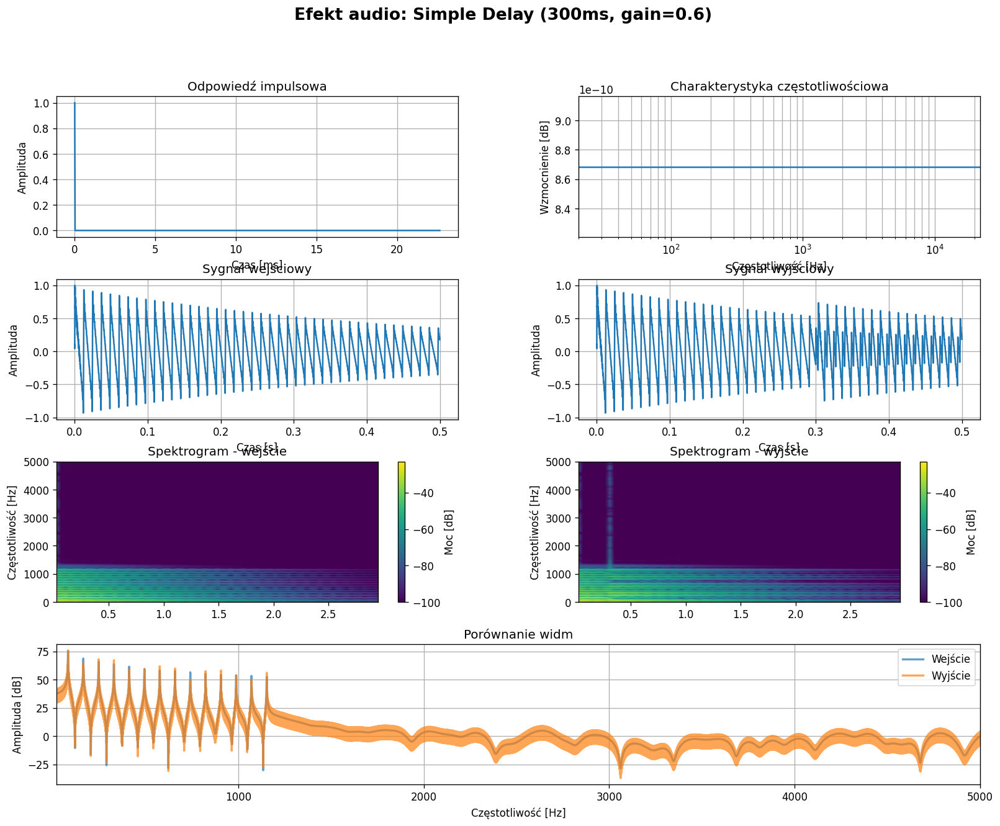

  Porównanie metod...
  Maksymalny błąd między metodami: 2.56e-03

2. Multi-tap Delay (Wielokrotne echo)


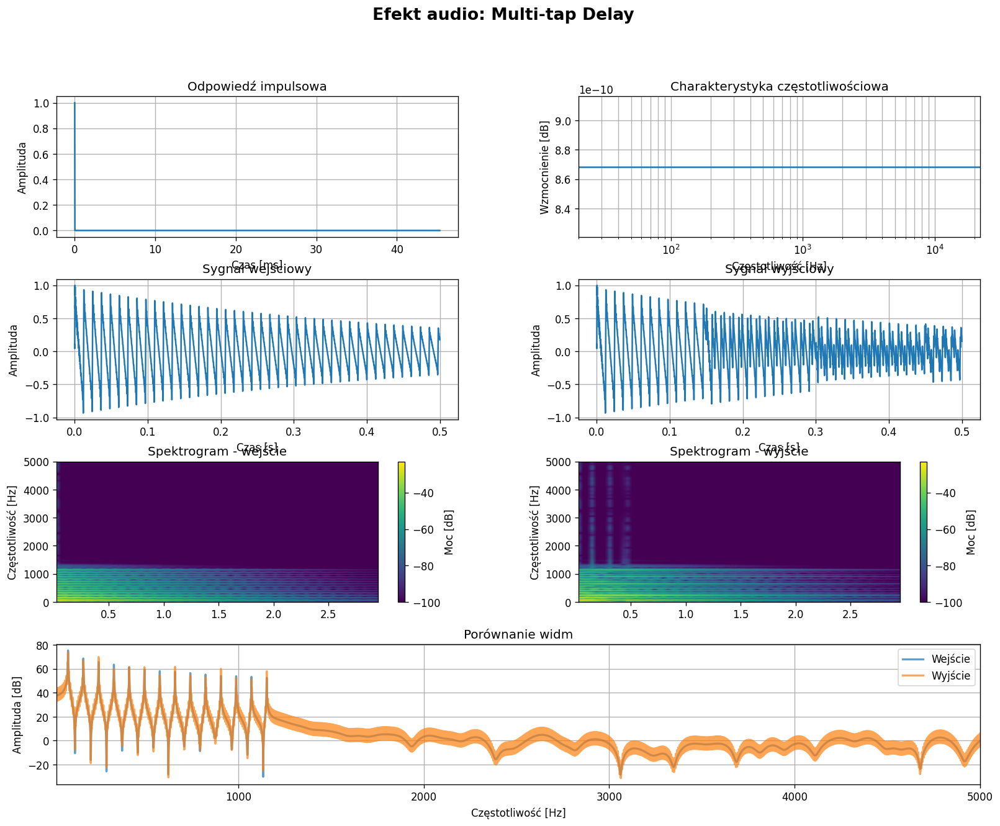


3. Chorus


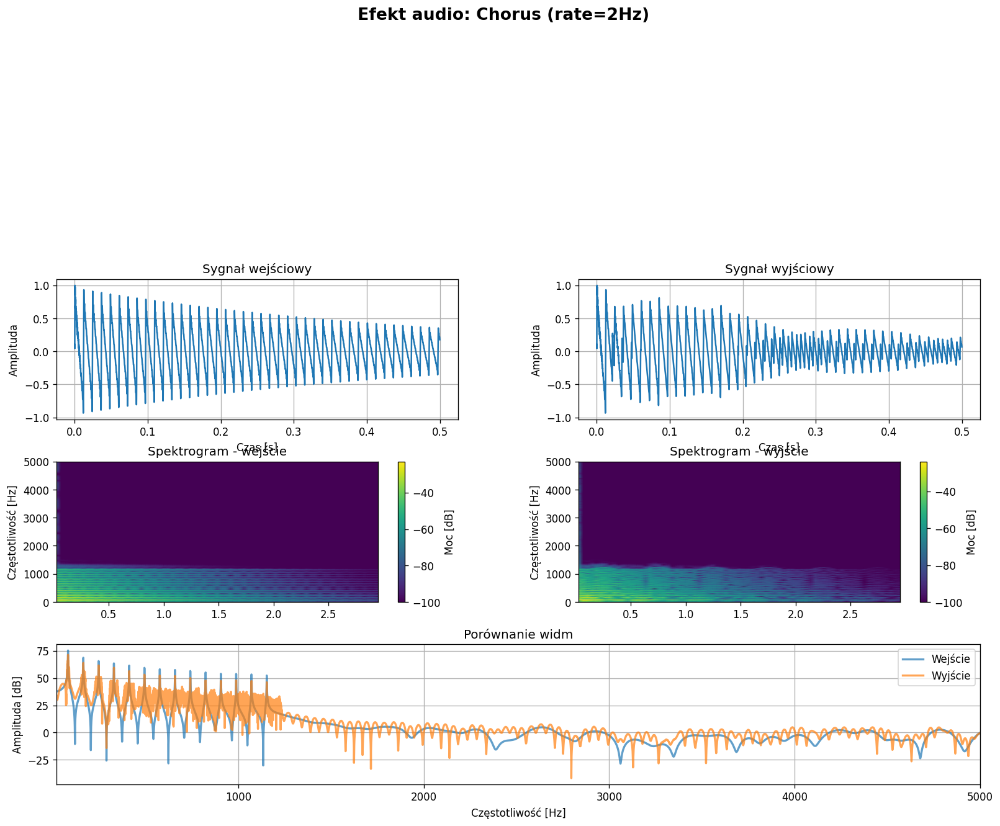


4. Flanger


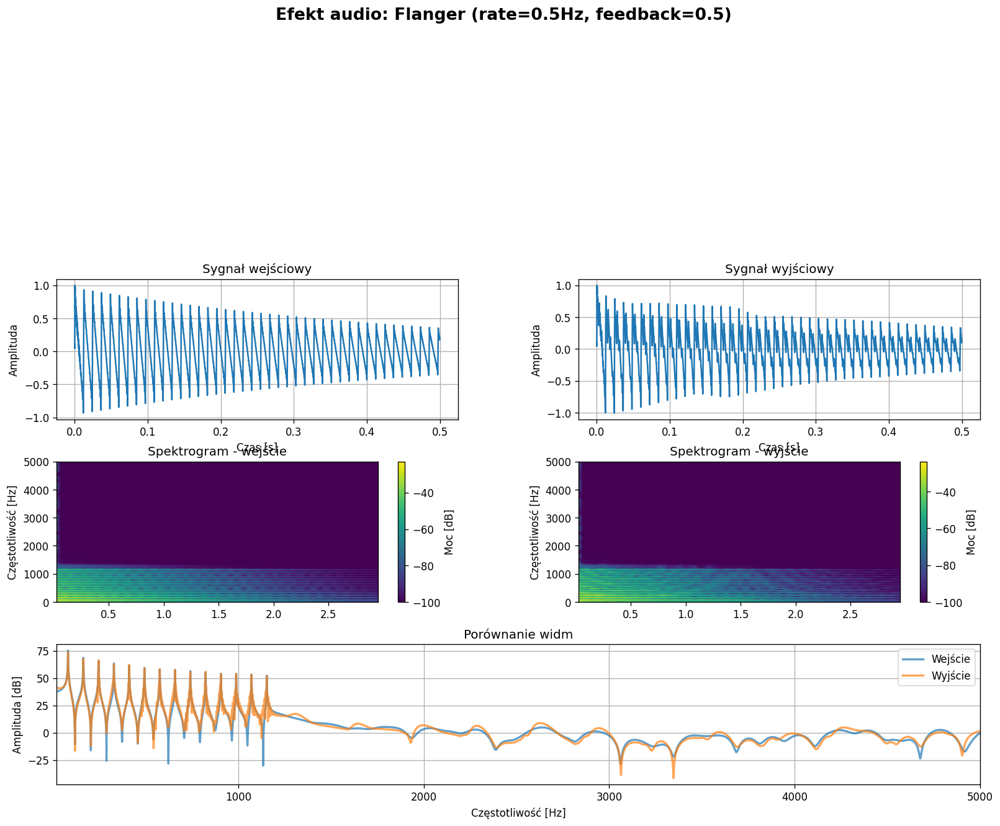

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import warnings
warnings.filterwarnings('ignore')

class AudioEffect:
    """
    Klasa bazowa dla efektów audio opartych na opóźnieniach
    """
    def __init__(self, fs=44100):
        self.fs = fs

    def apply(self, x):
        """Zastosuj efekt do sygnału x"""
        raise NotImplementedError

class SimpleDelay(AudioEffect):
    """
    Prosty efekt echo (delay)

    y(t) = x(t) + g · x(t - τ)

    gdzie:
    - g: wzmocnienie echa (0-1)
    - τ: opóźnienie
    """
    def __init__(self, delay_ms=500, gain=0.5, fs=44100):
        super().__init__(fs)
        self.delay_samples = int(delay_ms * fs / 1000)
        self.gain = gain

    def apply(self, x):
        """Implementacja w dziedzinie czasu (bezpośrednia)"""
        y = np.copy(x)

        # Dodaj opóźnioną kopię
        if self.delay_samples < len(x):
            y[self.delay_samples:] += self.gain * x[:-self.delay_samples]

        return y

    def apply_fft(self, x):
        """Implementacja w dziedzinie częstotliwości"""
        # Stwórz odpowiedź impulsową
        h = np.zeros(len(x))
        h[0] = 1.0  # sygnał bezpośredni
        if self.delay_samples < len(h):
            h[self.delay_samples] = self.gain  # opóźnienie

        # Zastosuj przez FFT
        X = np.fft.fft(x)
        H = np.fft.fft(h)
        Y = X * H
        y = np.fft.ifft(Y).real

        return y

    def get_impulse_response(self, length=1000):
        """Zwraca odpowiedź impulsową efektu"""
        h = np.zeros(length)
        h[0] = 1.0
        if self.delay_samples < length:
            h[self.delay_samples] = self.gain
        return h

class MultiTapDelay(AudioEffect):
    """
    Wielokrotne echo (multi-tap delay)

    y(t) = x(t) + Σ gᵢ · x(t - τᵢ)
    """
    def __init__(self, delays_ms=[250, 500, 750], gains=[0.5, 0.3, 0.2], fs=44100):
        super().__init__(fs)
        self.delays = [int(d * fs / 1000) for d in delays_ms]
        self.gains = gains

    def apply(self, x):
        y = np.copy(x)

        for delay, gain in zip(self.delays, self.gains):
            if delay < len(x):
                y[delay:] += gain * x[:-delay]

        return y

    def get_impulse_response(self, length=2000):
        h = np.zeros(length)
        h[0] = 1.0
        for delay, gain in zip(self.delays, self.gains):
            if delay < length:
                h[delay] = gain
        return h

class Chorus(AudioEffect):
    """
    Efekt chorus - modulowane opóźnienie

    Tworzy wrażenie wielu źródeł dźwięku przez dodanie
    sygnału z lekko zmiennym opóźnieniem
    """
    def __init__(self, base_delay_ms=20, depth_ms=5, rate_hz=2,
                 mix=0.5, fs=44100):
        super().__init__(fs)
        self.base_delay = int(base_delay_ms * fs / 1000)
        self.depth = int(depth_ms * fs / 1000)
        self.rate = rate_hz
        self.mix = mix

    def apply(self, x):
        N = len(x)
        t = np.arange(N) / self.fs

        # LFO (Low Frequency Oscillator) - moduluje opóźnienie
        lfo = np.sin(2 * np.pi * self.rate * t)

        # Zmienne opóźnienie
        delay = self.base_delay + self.depth * lfo

        # Sygnał wyjściowy
        y = np.zeros(N)

        for i in range(N):
            # Oblicz pozycję źródłową (z interpolacją)
            source_pos = i - delay[i]

            if source_pos >= 0 and source_pos < N - 1:
                # Interpolacja liniowa
                idx = int(source_pos)
                frac = source_pos - idx

                if idx + 1 < N:
                    delayed_sample = (1 - frac) * x[idx] + frac * x[idx + 1]
                    y[i] = (1 - self.mix) * x[i] + self.mix * delayed_sample
                else:
                    y[i] = x[i]
            else:
                y[i] = x[i]

        return y

class Flanger(AudioEffect):
    """
    Efekt flanger - krótkie, modulowane opóźnienie

    Podobny do chorus, ale z krótszym opóźnieniem
    i zazwyczaj z feedbackiem
    """
    def __init__(self, base_delay_ms=5, depth_ms=3, rate_hz=0.5,
                 feedback=0.3, mix=0.5, fs=44100):
        super().__init__(fs)
        self.base_delay = int(base_delay_ms * fs / 1000)
        self.depth = int(depth_ms * fs / 1000)
        self.rate = rate_hz
        self.feedback = feedback
        self.mix = mix

    def apply(self, x):
        N = len(x)
        t = np.arange(N) / self.fs

        # LFO - moduluje opóźnienie
        lfo = np.sin(2 * np.pi * self.rate * t)
        delay = self.base_delay + self.depth * lfo

        # Sygnał wyjściowy z feedbackiem
        y = np.zeros(N)

        for i in range(N):
            source_pos = i - delay[i]

            if source_pos >= 0 and source_pos < N - 1:
                idx = int(source_pos)
                frac = source_pos - idx

                if idx + 1 < N:
                    delayed_sample = (1 - frac) * y[idx] + frac * y[idx + 1]
                    # Mix z feedbackiem
                    y[i] = x[i] + self.feedback * delayed_sample
                else:
                    y[i] = x[i]
            else:
                y[i] = x[i]

        # Końcowy mix
        y = (1 - self.mix) * x + self.mix * y

        return y

def generate_test_signal(duration=3.0, fs=44100):
    """
    Generuje sygnał testowy (gitara)
    """
    t = np.linspace(0, duration, int(duration * fs))

    # Symulacja nuty gitarowej (E2 = 82.41 Hz)
    fundamental = 82.41

    # Harmoniczne z zanikającymi amplitudami
    signal_out = np.zeros_like(t)
    for n in range(1, 15):
        amplitude = 1.0 / n
        # Envelope - zanikające
        envelope = np.exp(-2 * t)
        signal_out += amplitude * envelope * np.sin(2 * np.pi * fundamental * n * t)

    # Dodaj atak (krótki szum)
    attack_duration = 0.01  # 10 ms
    attack_samples = int(attack_duration * fs)
    attack = np.random.randn(attack_samples) * 0.1
    attack *= np.linspace(1, 0, attack_samples)
    signal_out[:attack_samples] += attack

    # Normalizacja
    signal_out /= np.max(np.abs(signal_out))

    return signal_out, t

def visualize_effect(effect, signal_in, fs, effect_name):
    """
    Wizualizuje efekt działania systemu
    """
    # Zastosuj efekt
    signal_out = effect.apply(signal_in)

    # Przygotuj wizualizację
    fig = plt.figure(figsize=(16, 12))
    gs = fig.add_gridspec(4, 2, hspace=0.3, wspace=0.3)
    fig.suptitle(f'Efekt audio: {effect_name}', fontsize=16, fontweight='bold')

    # 1. Odpowiedź impulsowa
    if hasattr(effect, 'get_impulse_response'):
        ax1 = fig.add_subplot(gs[0, 0])
        h = effect.get_impulse_response()
        t_imp = np.arange(len(h)) / fs * 1000
        ax1.plot(t_imp, h)
        ax1.set_title('Odpowiedź impulsowa')
        ax1.set_xlabel('Czas [ms]')
        ax1.set_ylabel('Amplituda')
        ax1.grid(True)

        # 2. Charakterystyka częstotliwościowa
        ax2 = fig.add_subplot(gs[0, 1])
        H = np.fft.fft(h)
        freqs = np.fft.fftfreq(len(h), 1/fs)
        pos_idx = freqs >= 0

        ax2.semilogx(freqs[pos_idx], 20*np.log10(np.abs(H[pos_idx]) + 1e-10))
        ax2.set_title('Charakterystyka częstotliwościowa')
        ax2.set_xlabel('Częstotliwość [Hz]')
        ax2.set_ylabel('Wzmocnienie [dB]')
        ax2.grid(True, which='both')
        ax2.set_xlim([20, fs/2])

    # 3. Sygnał wejściowy (czasowy)
    ax3 = fig.add_subplot(gs[1, 0])
    t = np.arange(len(signal_in)) / fs
    plot_duration = min(0.5, len(signal_in)/fs)
    plot_samples = int(plot_duration * fs)
    ax3.plot(t[:plot_samples], signal_in[:plot_samples])
    ax3.set_title('Sygnał wejściowy')
    ax3.set_xlabel('Czas [s]')
    ax3.set_ylabel('Amplituda')
    ax3.grid(True)

    # 4. Sygnał wyjściowy (czasowy)
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.plot(t[:plot_samples], signal_out[:plot_samples])
    ax4.set_title('Sygnał wyjściowy')
    ax4.set_xlabel('Czas [s]')
    ax4.set_ylabel('Amplituda')
    ax4.grid(True)

    # 5. Spektrogram wejściowy
    ax5 = fig.add_subplot(gs[2, 0])
    f, t_spec, Sxx = signal.spectrogram(signal_in, fs, nperseg=2048)
    im1 = ax5.pcolormesh(t_spec, f, 10*np.log10(Sxx + 1e-10),
                         shading='gouraud', cmap='viridis')
    ax5.set_title('Spektrogram - wejście')
    ax5.set_ylabel('Częstotliwość [Hz]')
    ax5.set_ylim([0, 5000])
    plt.colorbar(im1, ax=ax5, label='Moc [dB]')

    # 6. Spektrogram wyjściowy
    ax6 = fig.add_subplot(gs[2, 1])
    f, t_spec, Sxx = signal.spectrogram(signal_out, fs, nperseg=2048)
    im2 = ax6.pcolormesh(t_spec, f, 10*np.log10(Sxx + 1e-10),
                         shading='gouraud', cmap='viridis')
    ax6.set_title('Spektrogram - wyjście')
    ax6.set_ylabel('Częstotliwość [Hz]')
    ax6.set_ylim([0, 5000])
    plt.colorbar(im2, ax=ax6, label='Moc [dB]')

    # 7. Porównanie widm
    ax7 = fig.add_subplot(gs[3, :])

    # FFT sygnałów
    X = np.fft.fft(signal_in)
    Y = np.fft.fft(signal_out)
    freqs = np.fft.fftfreq(len(signal_in), 1/fs)
    pos_idx = (freqs >= 20) & (freqs <= 5000)

    ax7.plot(freqs[pos_idx], 20*np.log10(np.abs(X[pos_idx]) + 1e-10),
             label='Wejście', alpha=0.7, linewidth=2)
    ax7.plot(freqs[pos_idx], 20*np.log10(np.abs(Y[pos_idx]) + 1e-10),
             label='Wyjście', alpha=0.7, linewidth=2)
    ax7.set_title('Porównanie widm')
    ax7.set_xlabel('Częstotliwość [Hz]')
    ax7.set_ylabel('Amplituda [dB]')
    ax7.legend()
    ax7.grid(True)
    ax7.set_xlim([20, 5000])

    plt.show()

def demonstrate_all_effects():
    """
    Demonstracja wszystkich efektów
    """
    fs = 44100

    # Generuj sygnał testowy
    print("Generowanie sygnału testowego...")
    test_signal, t = generate_test_signal(duration=3.0, fs=fs)

    # 1. Simple Delay
    print("\n1. Simple Delay (Echo)")
    delay_effect = SimpleDelay(delay_ms=300, gain=0.6, fs=fs)
    visualize_effect(delay_effect, test_signal, fs, "Simple Delay (300ms, gain=0.6)")

    # Porównanie metod
    print("  Porównanie metod...")
    out_time = delay_effect.apply(test_signal)
    out_freq = delay_effect.apply_fft(test_signal)
    error = np.max(np.abs(out_time - out_freq))
    print(f"  Maksymalny błąd między metodami: {error:.2e}")

    # 2. Multi-tap Delay
    print("\n2. Multi-tap Delay (Wielokrotne echo)")
    multitap = MultiTapDelay(delays_ms=[150, 300, 450],
                             gains=[0.5, 0.3, 0.2], fs=fs)
    visualize_effect(multitap, test_signal, fs, "Multi-tap Delay")

    # 3. Chorus
    print("\n3. Chorus")
    chorus = Chorus(base_delay_ms=20, depth_ms=5, rate_hz=2, mix=0.5, fs=fs)
    visualize_effect(chorus, test_signal, fs, "Chorus (rate=2Hz)")

    # 4. Flanger
    print("\n4. Flanger")
    flanger = Flanger(base_delay_ms=3, depth_ms=2, rate_hz=0.5,
                      feedback=0.5, mix=0.7, fs=fs)
    visualize_effect(flanger, test_signal, fs, "Flanger (rate=0.5Hz, feedback=0.5)")

# Uruchom demonstrację
demonstrate_all_effects()

5

Uruchamianie testów identyfikacji systemów...

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 40dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004270 (norm: 30.64%)
  Dekonwolucja:  0.003513 (norm: 25.21%)


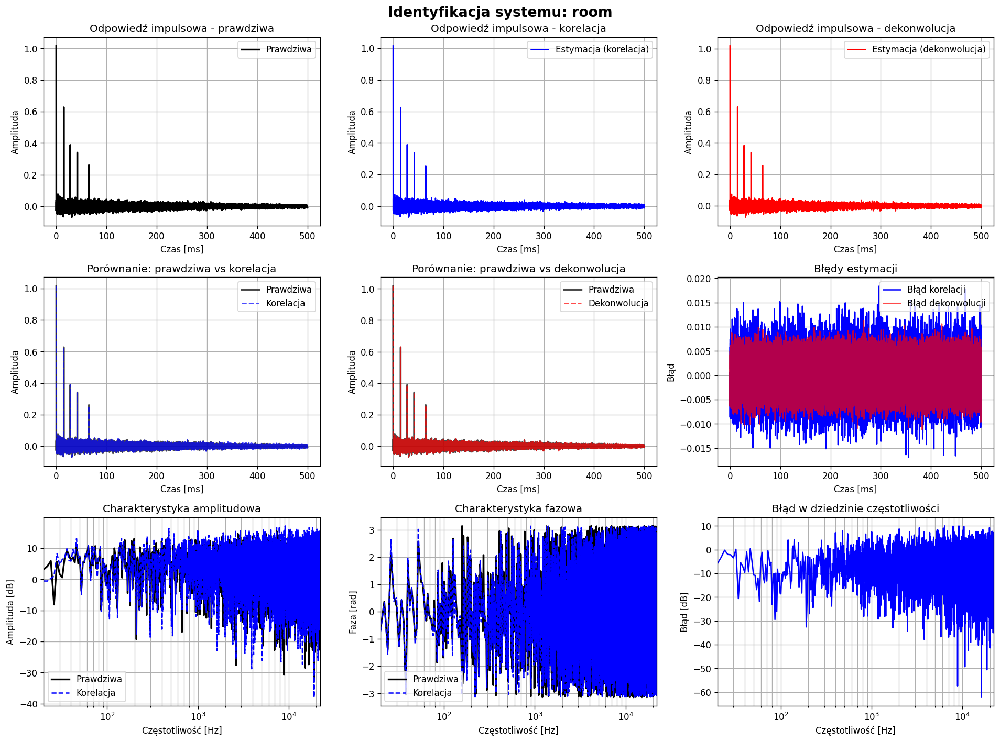


IDENTYFIKACJA SYSTEMU: FILTER
Czas testu: 3.0s, SNR: 40dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.000722 (norm: 8.65%)
  Dekonwolucja:  0.000029 (norm: 0.35%)


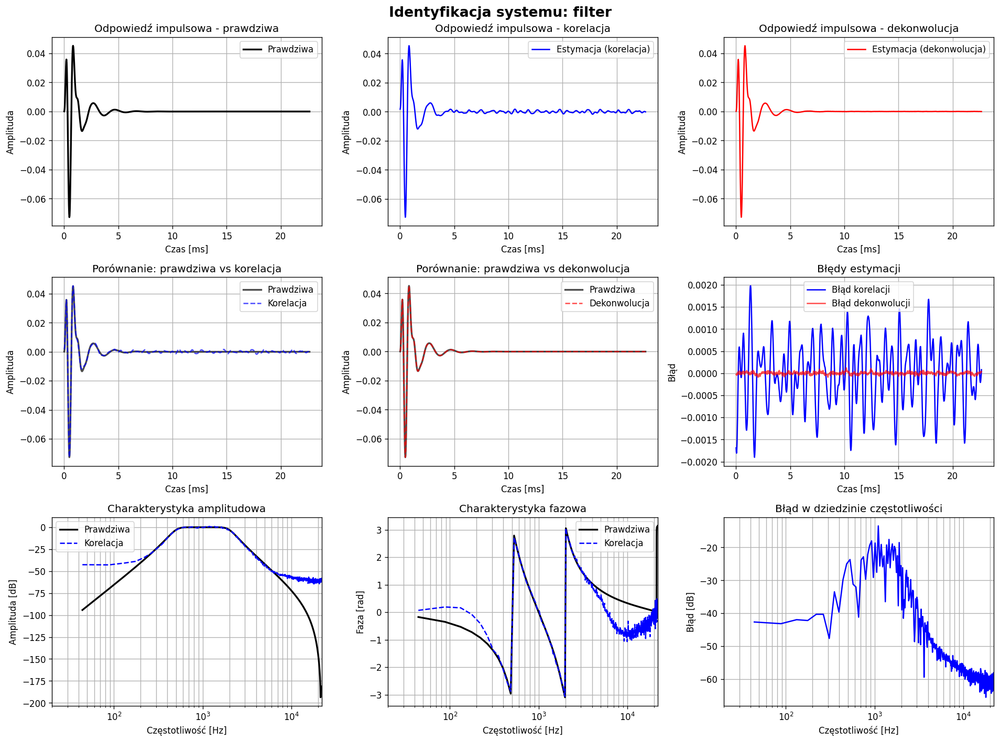


IDENTYFIKACJA SYSTEMU: MULTIPATH
Czas testu: 2.0s, SNR: 40dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004006 (norm: 7.67%)
  Dekonwolucja:  0.000261 (norm: 0.50%)


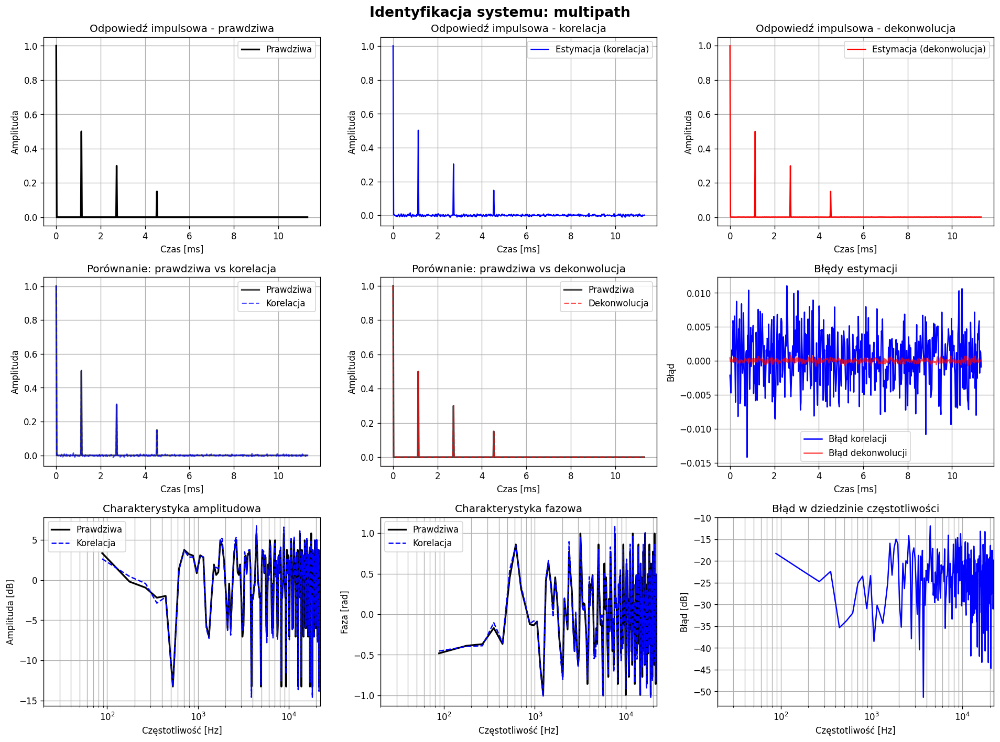


ANALIZA WPŁYWU SNR NA DOKŁADNOŚĆ ESTYMACJI

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 0dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.006048 (norm: 43.41%)
  Dekonwolucja:  0.015908 (norm: 114.18%)


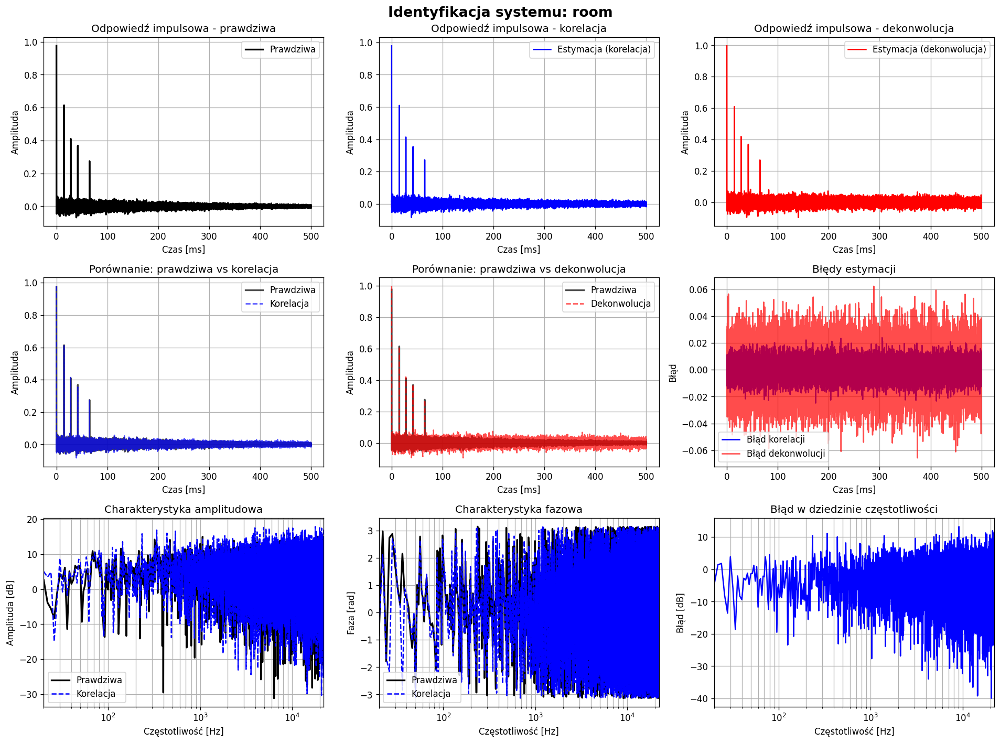

SNR =  0 dB: Błąd (korelacja) = 43.41%, Błąd (dekonwolucja) = 114.18%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 5dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004915 (norm: 35.16%)
  Dekonwolucja:  0.007620 (norm: 54.50%)


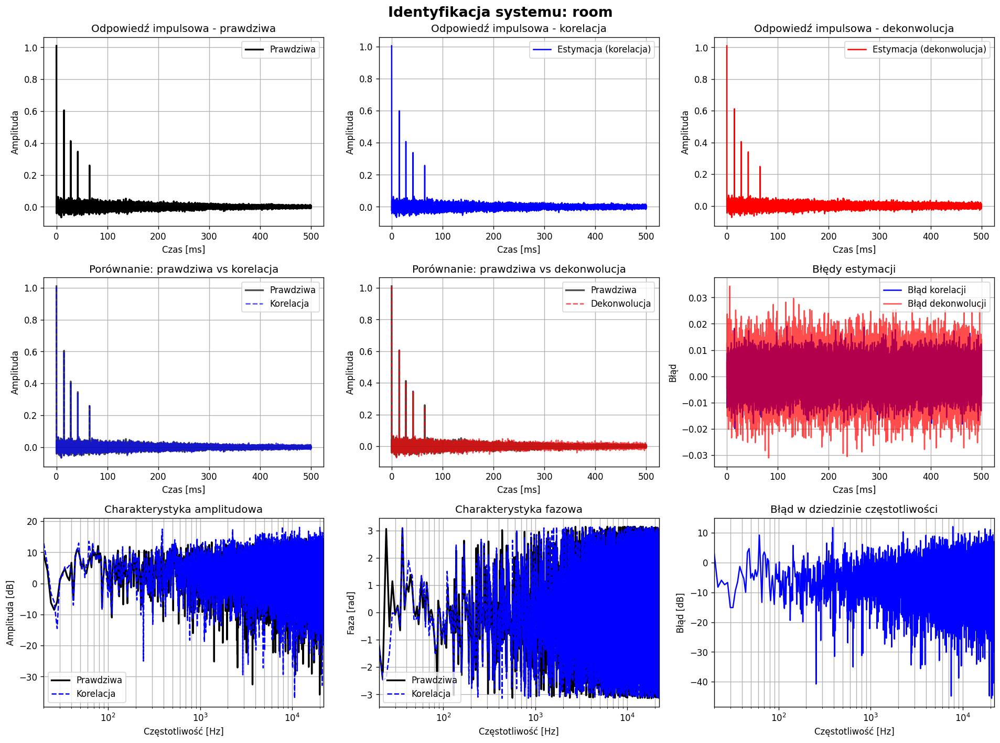

SNR =  5 dB: Błąd (korelacja) = 35.16%, Błąd (dekonwolucja) = 54.50%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 10dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004426 (norm: 31.94%)
  Dekonwolucja:  0.005054 (norm: 36.47%)


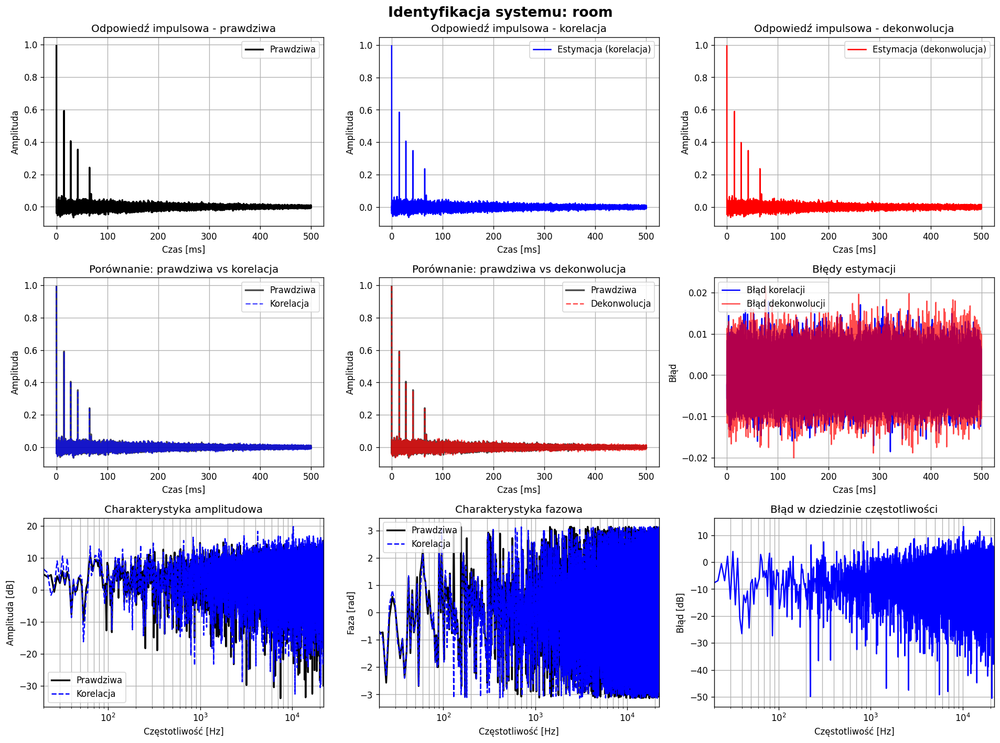

SNR = 10 dB: Błąd (korelacja) = 31.94%, Błąd (dekonwolucja) = 36.47%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 15dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004389 (norm: 31.61%)
  Dekonwolucja:  0.003130 (norm: 22.54%)


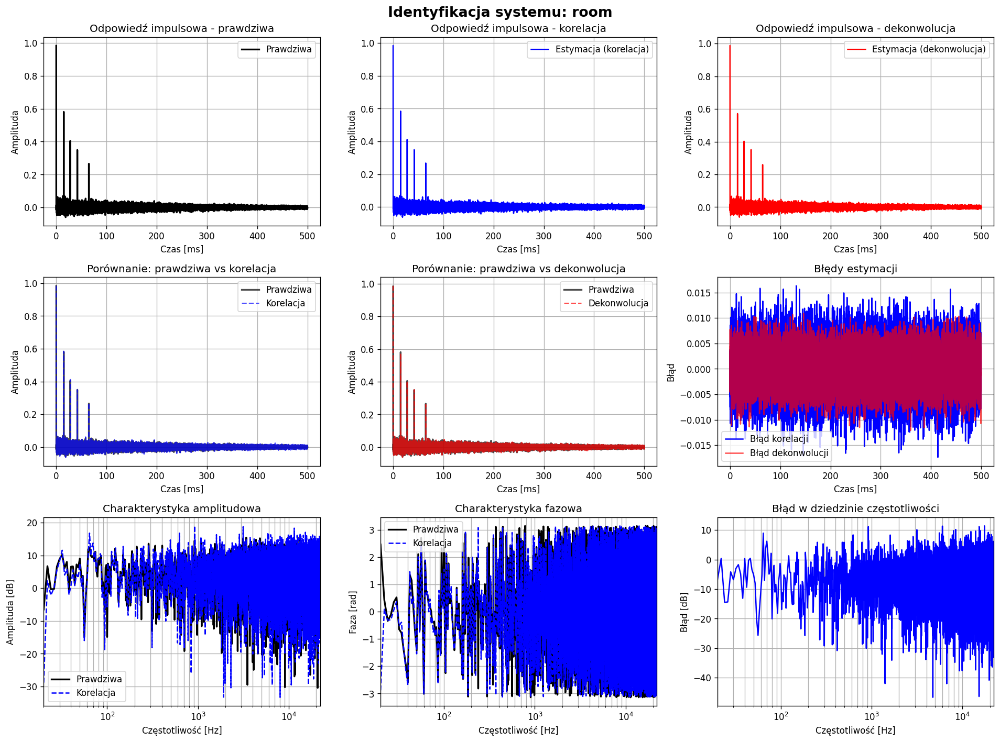

SNR = 15 dB: Błąd (korelacja) = 31.61%, Błąd (dekonwolucja) = 22.54%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 20dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004280 (norm: 30.96%)
  Dekonwolucja:  0.003289 (norm: 23.79%)


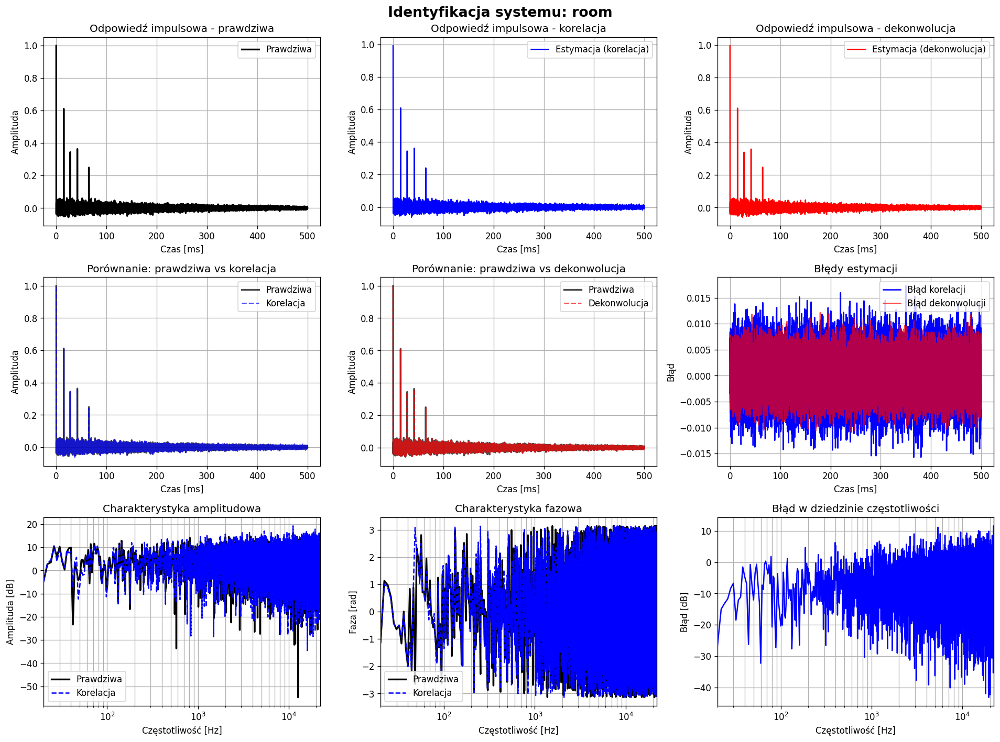

SNR = 20 dB: Błąd (korelacja) = 30.96%, Błąd (dekonwolucja) = 23.79%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 25dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004327 (norm: 30.89%)
  Dekonwolucja:  0.002162 (norm: 15.43%)


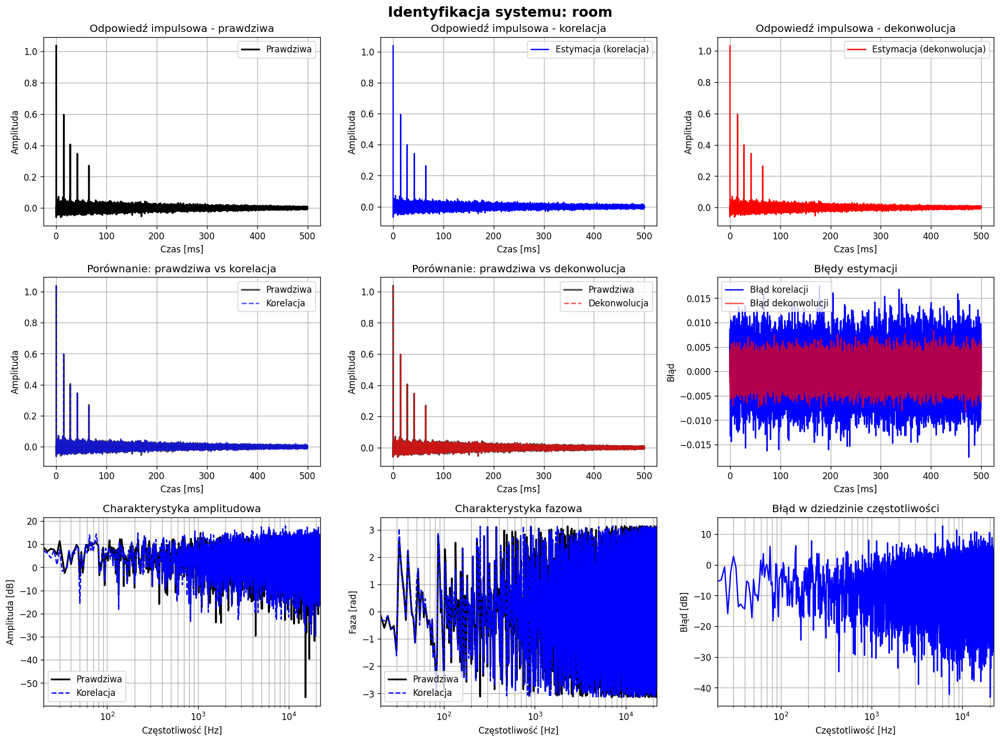

SNR = 25 dB: Błąd (korelacja) = 30.89%, Błąd (dekonwolucja) = 15.43%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 30dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004322 (norm: 30.94%)
  Dekonwolucja:  0.003714 (norm: 26.59%)


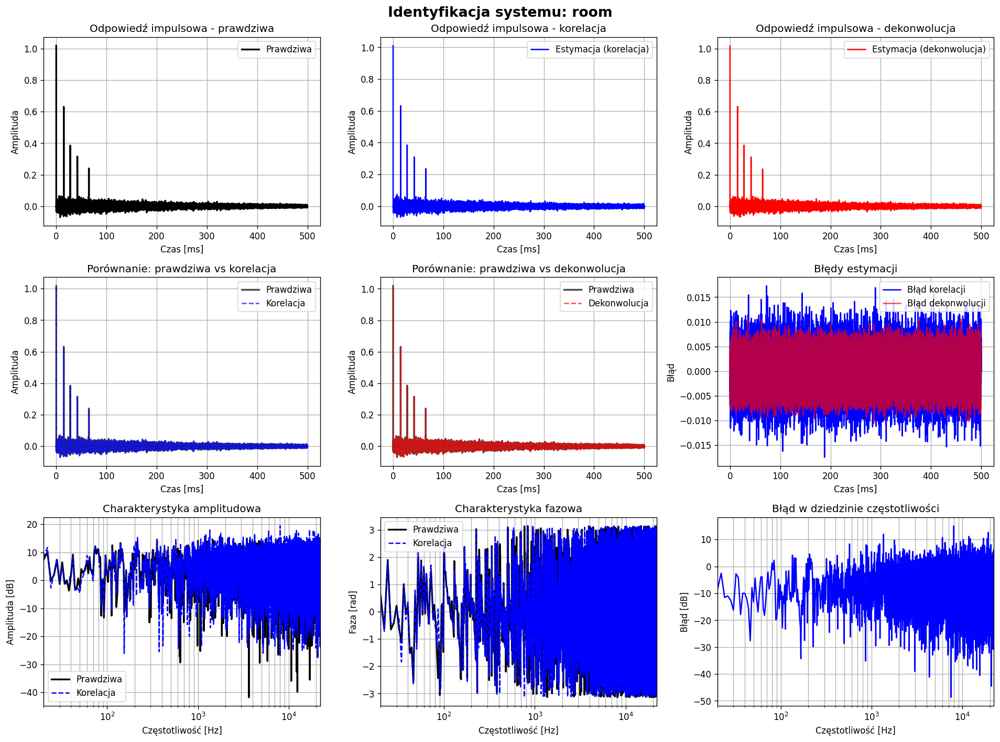

SNR = 30 dB: Błąd (korelacja) = 30.94%, Błąd (dekonwolucja) = 26.59%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 35dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004269 (norm: 30.81%)
  Dekonwolucja:  0.002006 (norm: 14.48%)


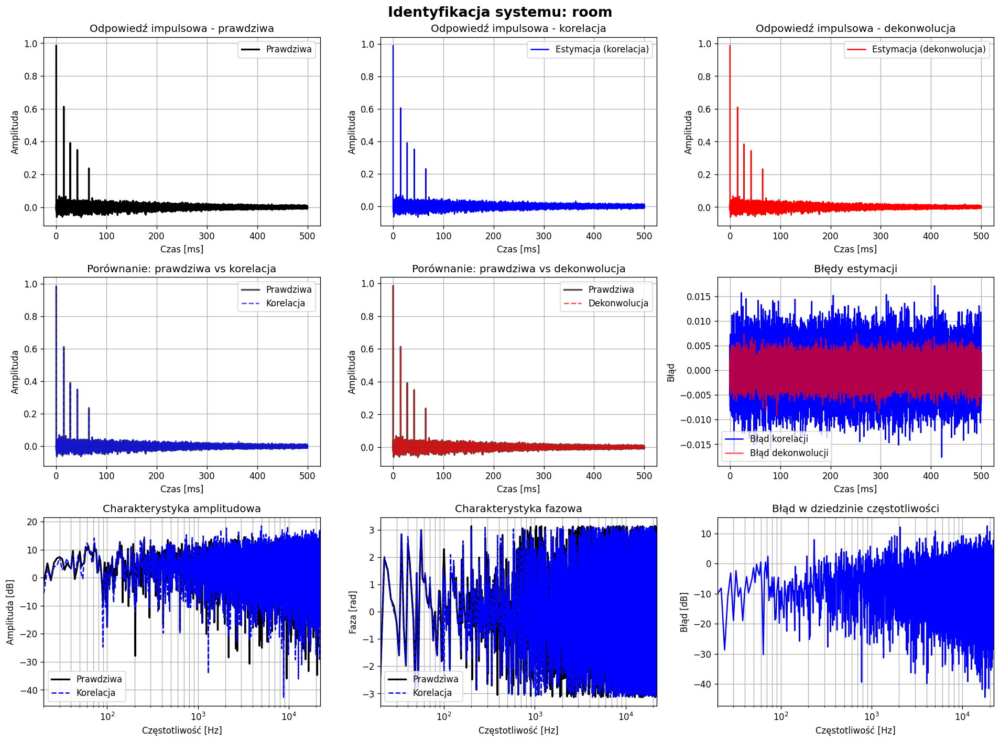

SNR = 35 dB: Błąd (korelacja) = 30.81%, Błąd (dekonwolucja) = 14.48%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 40dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004261 (norm: 30.70%)
  Dekonwolucja:  0.001777 (norm: 12.80%)


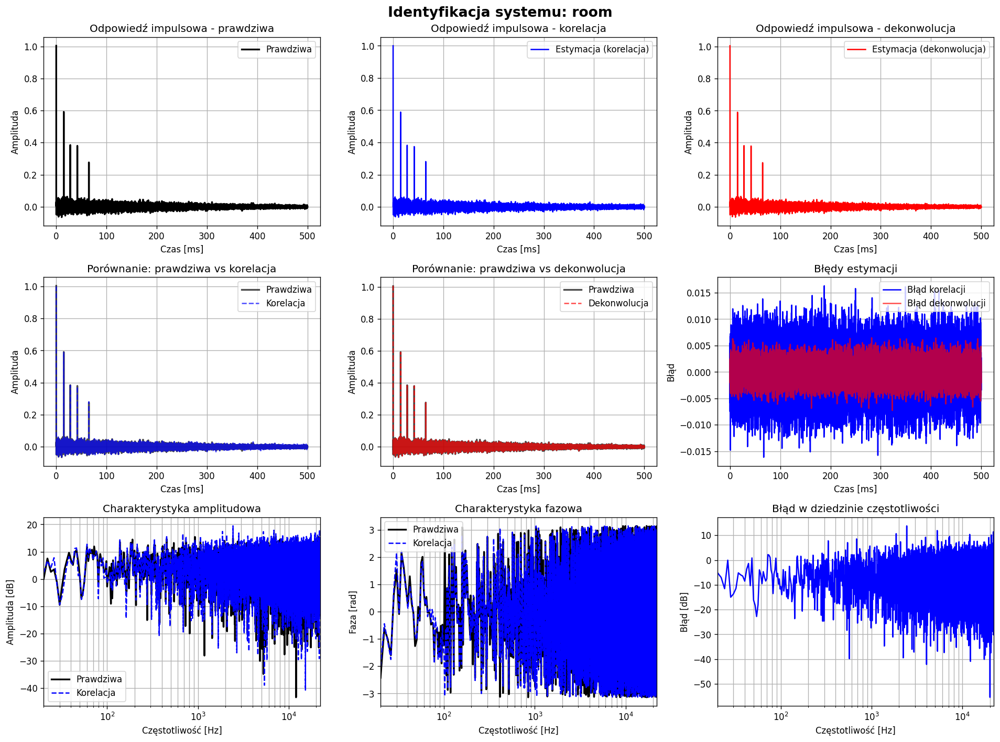

SNR = 40 dB: Błąd (korelacja) = 30.70%, Błąd (dekonwolucja) = 12.80%

IDENTYFIKACJA SYSTEMU: ROOM
Czas testu: 5.0s, SNR: 45dB

Estymacja odpowiedzi impulsowej...

Błędy estymacji (RMSE):
  Korelacja:     0.004351 (norm: 31.31%)
  Dekonwolucja:  0.001775 (norm: 12.77%)


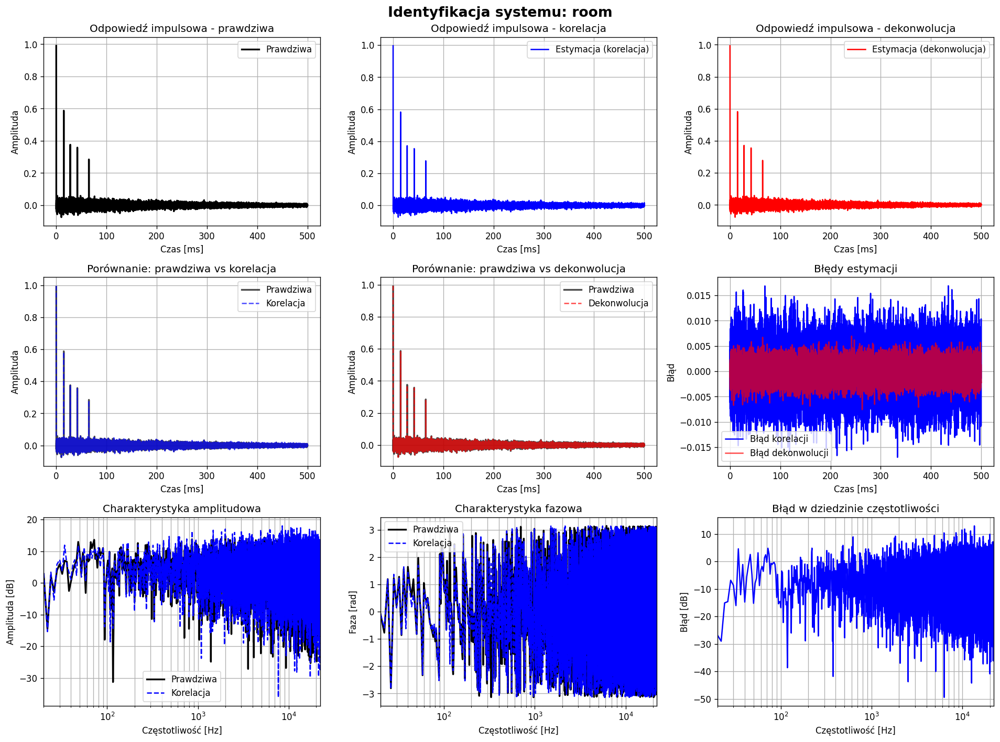

SNR = 45 dB: Błąd (korelacja) = 31.31%, Błąd (dekonwolucja) = 12.77%


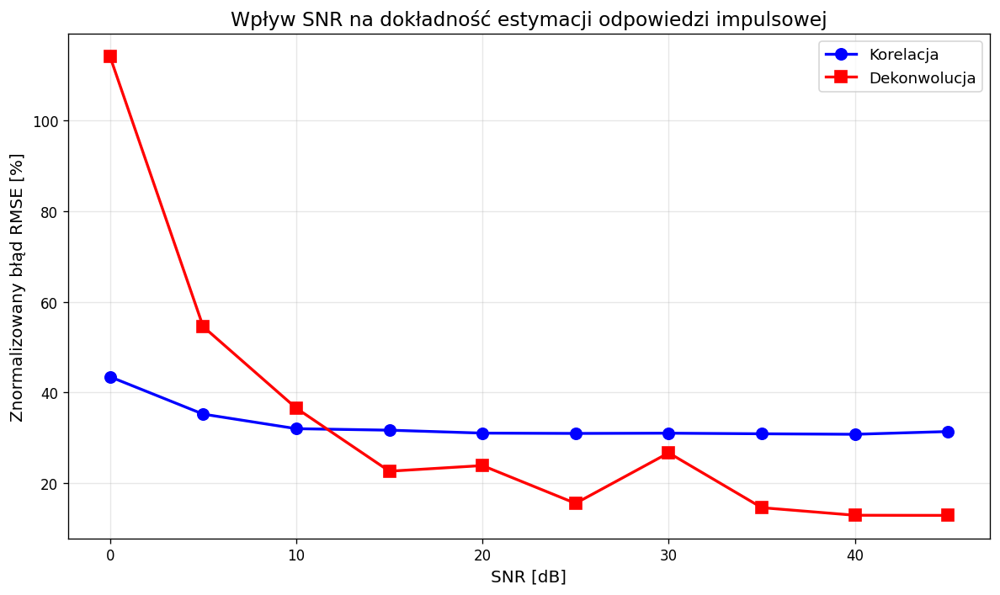

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, ifft

class BlackBoxSystem:
    """
    'Czarna skrzynka' - nieznany system LTI do identyfikacji
    """
    def __init__(self, system_type='room', fs=44100):
        self.fs = fs
        self.system_type = system_type
        self._create_system()

    def _create_system(self):
        """Tworzy ukrytą odpowiedź impulsową systemu"""
        if self.system_type == 'room':
            # Symulacja pomieszczenia
            duration = 0.5
            N = int(duration * self.fs)
            t = np.arange(N) / self.fs

            # Główny impuls
            self.h_true = np.zeros(N)
            self.h_true[0] = 1.0

            # Wczesne odbicia
            reflections = [
                (0.015, 0.6),
                (0.028, 0.4),
                (0.042, 0.35),
                (0.065, 0.25),
            ]

            for delay, gain in reflections:
                idx = int(delay * self.fs)
                if idx < N:
                    self.h_true[idx] = gain

            # Późny pogłos
            decay_time = 0.3
            reverb = np.exp(-t / decay_time) * np.random.randn(N) * 0.02
            self.h_true += reverb

        elif self.system_type == 'filter':
            # Filtr pasmowo-przepustowy
            sos = signal.butter(4, [500, 2000], 'bandpass', fs=self.fs, output='sos')
            # Odpowiedź impulsowa filtru
            impulse = np.zeros(1000)
            impulse[0] = 1
            self.h_true = signal.sosfilt(sos, impulse)

        elif self.system_type == 'multipath':
            # System z wielodrogowością (np. komunikacja)
            N = 500
            self.h_true = np.zeros(N)

            # Ścieżki propagacji
            paths = [
                (0, 1.0),      # ścieżka bezpośrednia
                (50, 0.5),     # pierwsza droga odbita
                (120, 0.3),    # druga droga odbita
                (200, 0.15),   # trzecia droga odbita
            ]

            for delay, gain in paths:
                if delay < N:
                    self.h_true[delay] = gain

    def process(self, x, add_noise=True, snr_db=40):
        """
        Przetwarza sygnał przez system

        Parameters:
        -----------
        x : array
            Sygnał wejściowy
        add_noise : bool
            Czy dodać szum na wyjściu
        snr_db : float
            Stosunek sygnał/szum w dB
        """
        # Splot
        y = signal.convolve(x, self.h_true, mode='full')

        # Przytnij do długości wejścia
        y = y[:len(x)]

        if add_noise:
            # Dodaj szum addytywny
            signal_power = np.mean(y**2)
            noise_power = signal_power / (10**(snr_db/10))
            noise = np.sqrt(noise_power) * np.random.randn(len(y))
            y += noise

        return y

    def get_true_response(self):
        """Zwraca prawdziwą odpowiedź impulsową (do weryfikacji)"""
        return self.h_true.copy()

def estimate_impulse_response_correlation(x, y, method='correlation'):
    """
    Estymuje odpowiedź impulsową używając korelacji wzajemnej

    Dla białego szumu: h ≈ R_xy / R_xx
    gdzie:
    - R_xy: korelacja wzajemna między wejściem a wyjściem
    - R_xx: autokorelacja wejścia

    Parameters:
    -----------
    x : array
        Sygnał wejściowy (powinien być białym szumem)
    y : array
        Sygnał wyjściowy
    method : str
        'correlation' lub 'deconvolution'
    """
    if method == 'correlation':
        # Metoda korelacji wzajemnej
        # R_xy = E[y[n] * x[n-m]]
        R_xy = signal.correlate(y, x, mode='full', method='fft')

        # Normalizacja przez energię sygnału wejściowego
        # Dla białego szumu: R_xx ≈ σ²δ[m]
        energy_x = np.sum(x**2)
        h_est = R_xy / energy_x

        # Wycentruj (korelacja jest symetryczna)
        center = len(h_est) // 2
        h_est = h_est[center:]

    elif method == 'deconvolution':
        # Metoda dekonwolucji w dziedzinie częstotliwości
        # H = Y / X

        N = max(len(x), len(y))
        X = fft(x, N)
        Y = fft(y, N)

        # Regularyzowana dekonwolucja (Wiener)
        epsilon = 1e-10  # regularyzacja
        H_est = Y * np.conj(X) / (np.abs(X)**2 + epsilon)

        h_est = ifft(H_est).real

        # Przytnij do rozsądnej długości
        h_est = h_est[:len(y)]

    return h_est

def test_system_identification(system_type='room', test_duration=5.0,
                               snr_db=40, fs=44100):
    """
    Pełny test identyfikacji systemu
    """
    print(f"\n{'='*70}")
    print(f"IDENTYFIKACJA SYSTEMU: {system_type.upper()}")
    print(f"Czas testu: {test_duration}s, SNR: {snr_db}dB")
    print('='*70)

    # 1. Stwórz czarną skrzynkę
    system = BlackBoxSystem(system_type=system_type, fs=fs)
    h_true = system.get_true_response()

    # 2. Generuj sygnał testowy (biały szum)
    N_test = int(test_duration * fs)
    x_test = np.random.randn(N_test)
    x_test /= np.std(x_test)  # normalizacja

    # 3. Pobierz odpowiedź systemu
    y_test = system.process(x_test, add_noise=True, snr_db=snr_db)

    # 4. Estymuj odpowiedź impulsową (dwie metody)
    print("\nEstymacja odpowiedzi impulsowej...")
    h_est_corr = estimate_impulse_response_correlation(x_test, y_test, method='correlation')
    h_est_deconv = estimate_impulse_response_correlation(x_test, y_test, method='deconvolution')

    # 5. Przytnij do tej samej długości dla porównania
    max_len = min(len(h_true), len(h_est_corr), len(h_est_deconv))
    h_true_trim = h_true[:max_len]
    h_est_corr_trim = h_est_corr[:max_len]
    h_est_deconv_trim = h_est_deconv[:max_len]

    # 6. Oblicz błędy
    error_corr = np.sqrt(np.mean((h_true_trim - h_est_corr_trim)**2))
    error_deconv = np.sqrt(np.mean((h_true_trim - h_est_deconv_trim)**2))

    # Znormalizowany błąd
    norm_error_corr = error_corr / np.sqrt(np.mean(h_true_trim**2))
    norm_error_deconv = error_deconv / np.sqrt(np.mean(h_true_trim**2))

    print(f"\nBłędy estymacji (RMSE):")
    print(f"  Korelacja:     {error_corr:.6f} (norm: {norm_error_corr:.2%})")
    print(f"  Dekonwolucja:  {error_deconv:.6f} (norm: {norm_error_deconv:.2%})")

    # 7. Wizualizacja
    fig, axes = plt.subplots(3, 3, figsize=(16, 12))
    fig.suptitle(f'Identyfikacja systemu: {system_type}', fontsize=16, fontweight='bold')

    t_imp = np.arange(max_len) / fs * 1000  # ms

    # Odpowiedzi impulsowe
    axes[0, 0].plot(t_imp, h_true_trim, 'k-', linewidth=2, label='Prawdziwa')
    axes[0, 0].set_title('Odpowiedź impulsowa - prawdziwa')
    axes[0, 0].set_xlabel('Czas [ms]')
    axes[0, 0].set_ylabel('Amplituda')
    axes[0, 0].grid(True)
    axes[0, 0].legend()

    axes[0, 1].plot(t_imp, h_est_corr_trim, 'b-', label='Estymacja (korelacja)')
    axes[0, 1].set_title('Odpowiedź impulsowa - korelacja')
    axes[0, 1].set_xlabel('Czas [ms]')
    axes[0, 1].set_ylabel('Amplituda')
    axes[0, 1].grid(True)
    axes[0, 1].legend()

    axes[0, 2].plot(t_imp, h_est_deconv_trim, 'r-', label='Estymacja (dekonwolucja)')
    axes[0, 2].set_title('Odpowiedź impulsowa - dekonwolucja')
    axes[0, 2].set_xlabel('Czas [ms]')
    axes[0, 2].set_ylabel('Amplituda')
    axes[0, 2].grid(True)
    axes[0, 2].legend()

    # Porównanie
    axes[1, 0].plot(t_imp, h_true_trim, 'k-', linewidth=2, label='Prawdziwa', alpha=0.7)
    axes[1, 0].plot(t_imp, h_est_corr_trim, 'b--', label='Korelacja', alpha=0.7)
    axes[1, 0].set_title('Porównanie: prawdziwa vs korelacja')
    axes[1, 0].set_xlabel('Czas [ms]')
    axes[1, 0].set_ylabel('Amplituda')
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    axes[1, 1].plot(t_imp, h_true_trim, 'k-', linewidth=2, label='Prawdziwa', alpha=0.7)
    axes[1, 1].plot(t_imp, h_est_deconv_trim, 'r--', label='Dekonwolucja', alpha=0.7)
    axes[1, 1].set_title('Porównanie: prawdziwa vs dekonwolucja')
    axes[1, 1].set_xlabel('Czas [ms]')
    axes[1, 1].set_ylabel('Amplituda')
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    # Błędy
    error_corr_full = h_true_trim - h_est_corr_trim
    error_deconv_full = h_true_trim - h_est_deconv_trim

    axes[1, 2].plot(t_imp, error_corr_full, 'b-', label='Błąd korelacji')
    axes[1, 2].plot(t_imp, error_deconv_full, 'r-', label='Błąd dekonwolucji', alpha=0.7)
    axes[1, 2].set_title('Błędy estymacji')
    axes[1, 2].set_xlabel('Czas [ms]')
    axes[1, 2].set_ylabel('Błąd')
    axes[1, 2].legend()
    axes[1, 2].grid(True)

    # Charakterystyki częstotliwościowe
    H_true = fft(h_true_trim)
    H_est_corr = fft(h_est_corr_trim)
    H_est_deconv = fft(h_est_deconv_trim)
    freqs = np.fft.fftfreq(max_len, 1/fs)
    pos_idx = (freqs >= 20) & (freqs <= fs/2)

    axes[2, 0].semilogx(freqs[pos_idx], 20*np.log10(np.abs(H_true[pos_idx]) + 1e-10),
                        'k-', linewidth=2, label='Prawdziwa')
    axes[2, 0].semilogx(freqs[pos_idx], 20*np.log10(np.abs(H_est_corr[pos_idx]) + 1e-10),
                        'b--', label='Korelacja')
    axes[2, 0].set_title('Charakterystyka amplitudowa')
    axes[2, 0].set_xlabel('Częstotliwość [Hz]')
    axes[2, 0].set_ylabel('Amplituda [dB]')
    axes[2, 0].legend()
    axes[2, 0].grid(True, which='both')
    axes[2, 0].set_xlim([20, fs/2])

    axes[2, 1].semilogx(freqs[pos_idx], np.angle(H_true[pos_idx]),
                        'k-', linewidth=2, label='Prawdziwa')
    axes[2, 1].semilogx(freqs[pos_idx], np.angle(H_est_corr[pos_idx]),
                        'b--', label='Korelacja')
    axes[2, 1].set_title('Charakterystyka fazowa')
    axes[2, 1].set_xlabel('Częstotliwość [Hz]')
    axes[2, 1].set_ylabel('Faza [rad]')
    axes[2, 1].legend()
    axes[2, 1].grid(True, which='both')
    axes[2, 1].set_xlim([20, fs/2])

    # Błąd w dziedzinie częstotliwości
    error_freq = 20*np.log10(np.abs(H_true[pos_idx] - H_est_corr[pos_idx]) + 1e-10)
    axes[2, 2].semilogx(freqs[pos_idx], error_freq, 'b-')
    axes[2, 2].set_title('Błąd w dziedzinie częstotliwości')
    axes[2, 2].set_xlabel('Częstotliwość [Hz]')
    axes[2, 2].set_ylabel('Błąd [dB]')
    axes[2, 2].grid(True, which='both')
    axes[2, 2].set_xlim([20, fs/2])

    plt.tight_layout()
    plt.show()

    return {
        'h_true': h_true,
        'h_est_corr': h_est_corr,
        'h_est_deconv': h_est_deconv,
        'error_corr': norm_error_corr,
        'error_deconv': norm_error_deconv
    }

def analyze_snr_influence():
    """
    Analizuje wpływ SNR na dokładność estymacji
    """
    snr_values = np.arange(0, 50, 5)  # dB
    errors_corr = []
    errors_deconv = []

    system_type = 'room'
    test_duration = 5.0
    fs = 44100

    print("\n" + "="*70)
    print("ANALIZA WPŁYWU SNR NA DOKŁADNOŚĆ ESTYMACJI")
    print("="*70)

    for snr in snr_values:
        result = test_system_identification(system_type, test_duration,
                                            snr_db=snr, fs=fs)
        errors_corr.append(result['error_corr'])
        errors_deconv.append(result['error_deconv'])

        print(f"SNR = {snr:2d} dB: Błąd (korelacja) = {result['error_corr']:.2%}, "
              f"Błąd (dekonwolucja) = {result['error_deconv']:.2%}")

    # Wykres
    plt.figure(figsize=(10, 6))
    plt.plot(snr_values, np.array(errors_corr) * 100, 'bo-', linewidth=2,
             markersize=8, label='Korelacja')
    plt.plot(snr_values, np.array(errors_deconv) * 100, 'rs-', linewidth=2,
             markersize=8, label='Dekonwolucja')
    plt.xlabel('SNR [dB]', fontsize=12)
    plt.ylabel('Znormalizowany błąd RMSE [%]', fontsize=12)
    plt.title('Wpływ SNR na dokładność estymacji odpowiedzi impulsowej', fontsize=14)
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Testy
print("Uruchamianie testów identyfikacji systemów...")

# Test 1: Pomieszczenie
test_system_identification('room', test_duration=5.0, snr_db=40)

# Test 2: Filtr
test_system_identification('filter', test_duration=3.0, snr_db=40)

# Test 3: System wielodrogowy
test_system_identification('multipath', test_duration=2.0, snr_db=40)

# Test 4: Analiza wpływu SNR
analyze_snr_influence()